# Machine Learning Pipeline: Bundesliga Vorhersage ⚽

In diesem Notebook erstellen wir eine Machine Learning Pipeline für das Bundesliga Vorhersage-Projekt.
Schritte:
1. **Data Exploration (EDA)**: Einfache Statistiken, Grafiken, Korrelationsanalyse, Ausreißer.
2. **Dataframes / Varianten**: Wir erzeugen 8 verschiedene Datensätze zum Testen:
   - Unbereinigt vs. Ohne Ausreißer
   - Mit xG vs. Ohne xG
   - Alle Features vs. Stark korrelierende Features
3. **Modellierung**: Hyperparameter-Tuning via Cross-Validation.
4. **Auswertung**: Stabile und finale Evaluation des besten Modells.

In [1]:
import sys
import os
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, RandomizedSearchCV, StratifiedKFold
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from xgboost import XGBClassifier

sns.set_theme(style="whitegrid")
plt.rcParams["figure.figsize"] = (12, 6)

sys.path.append(os.path.abspath('..'))
from utils import load_bundesliga_data, load_xg_data, compute_rolling_features, merge_xg_features, add_derived_features

print("Setup abgeschlossen.")

Setup abgeschlossen.


## 1. Daten laden und vorbereiten
Wir nutzen die bestehenden Funktionen aus `utils.py`, um die Rohdaten zu laden und die ersten Features (Rolling Averages) zu berechnen.

In [2]:
# Spieldaten laden
df_matches = load_bundesliga_data()
print(f"Spiele gesamt geladen: {len(df_matches)}")

# Rolling Features berechnen
df_base = compute_rolling_features(df_matches)

# xG Daten laden
df_xg = load_xg_data()

# Varianten mit xG und ohne xG erzeugen (Grundlage für die späteren DataFrames)
df_with_xg = merge_xg_features(df_base, df_xg)

# Abgeleitete Features berechnen
df_base = add_derived_features(df_base, include_xg=False)
df_with_xg = add_derived_features(df_with_xg, include_xg=True)

# Zeilen mit fehlenden Werten (am Anfang der Saison wegen Rolling Window) entfernen, 
# aber noch keine Outlier-Bereinigung.
from utils import BASE_FEATURES, XG_FEATURES
df_base = df_base.dropna(subset=BASE_FEATURES + ['FTR'])
df_with_xg = df_with_xg.dropna(subset=XG_FEATURES + ['FTR'])

# Um die FTR-Performance sinvoll in der Korrelationsmatrix analysieren zu können, encoden wir sie.
# Home-Win (H) = 1, Draw (D) = 0, Away-Win (A) = -1
# Damit steht Target für "Erfolg der Heimmannschaft"
mapping = {'H': 1, 'D': 0, 'A': -1}
df_base['Target_Heimerfolg'] = df_base['FTR'].map(mapping)
df_with_xg['Target_Heimerfolg'] = df_with_xg['FTR'].map(mapping)

print(f"Nach NA-Drop (ungesäuberte Basis): {len(df_base)} Spiele (Base), {len(df_with_xg)} Spiele (w/ xG)")


Spiele gesamt geladen: 3024
   📊 xG-Daten: Vorjahres-Lag für historische Saisons, direkte Nutzung für aktuelle Saison
Nach NA-Drop (ungesäuberte Basis): 2982 Spiele (Base), 2301 Spiele (w/ xG)


## 2. Data Exploration (EDA)
### 2.1 Zielvariable (FTR) – Verteilung der Spielausgänge

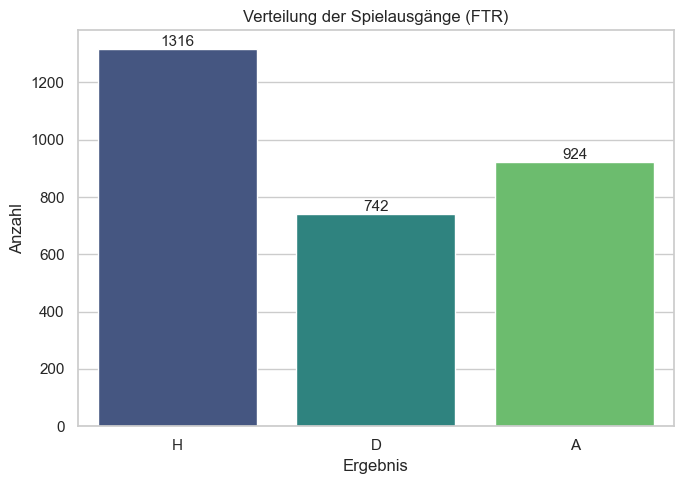

In [3]:
# --- 2.1 Zielvariable (FTR) Verteilung ---
fig, ax = plt.subplots(figsize=(7, 5))
sns.countplot(data=df_base, x='FTR', order=['H', 'D', 'A'],
              hue='FTR', legend=False, palette='viridis', ax=ax)
ax.set_title("Verteilung der Spielausgänge (FTR)")
ax.set_xlabel("Ergebnis")
ax.set_ylabel("Anzahl")
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom', fontsize=11)
plt.tight_layout()
plt.show()

### 2.2 Histogramme – Verteilung jeder Variable

Plotte 25 Histogramme für BASE_FEATURES...



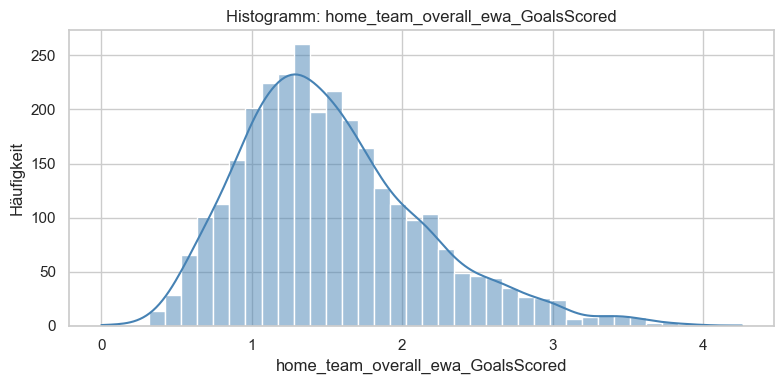

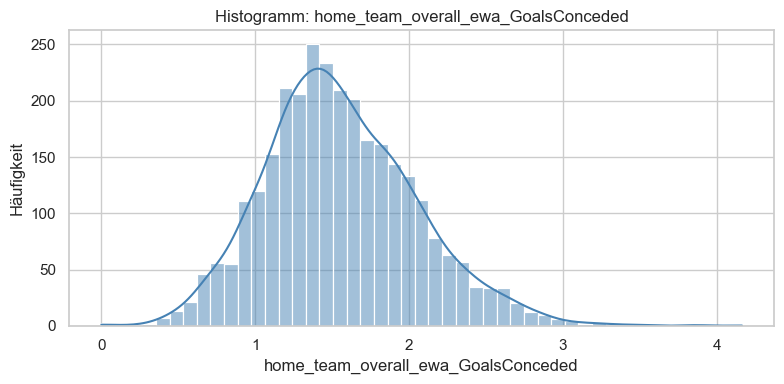

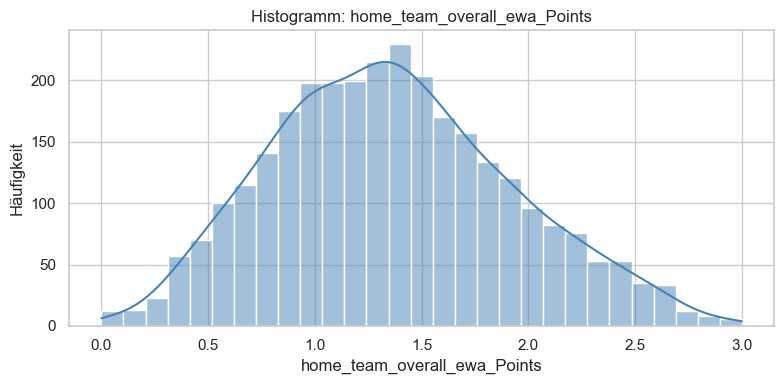

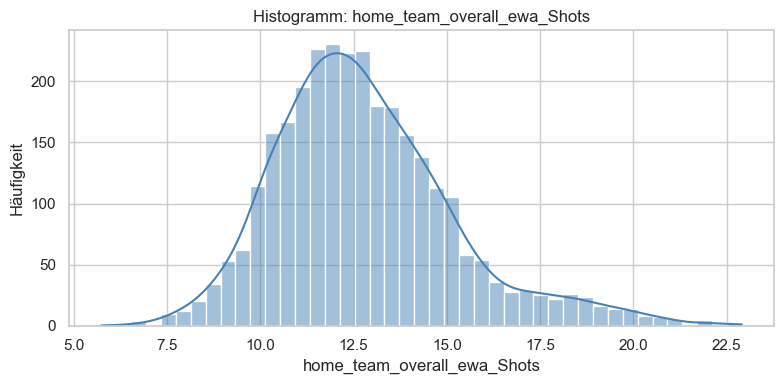

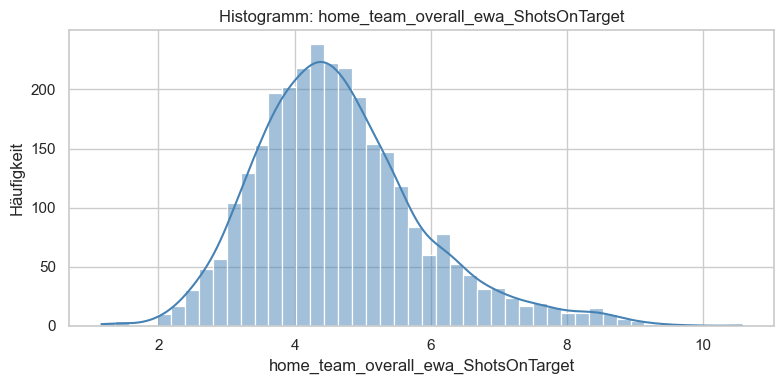

...

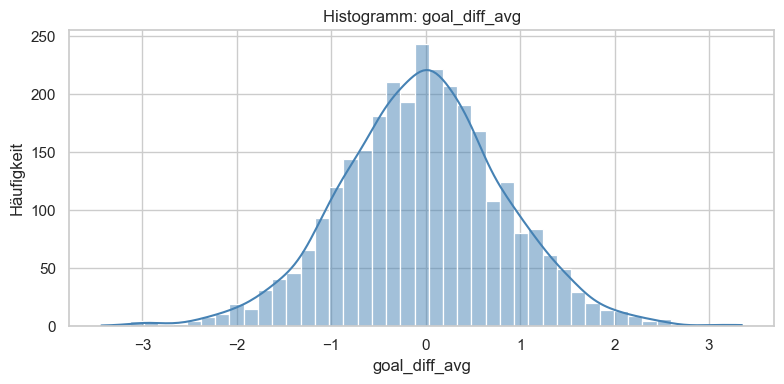

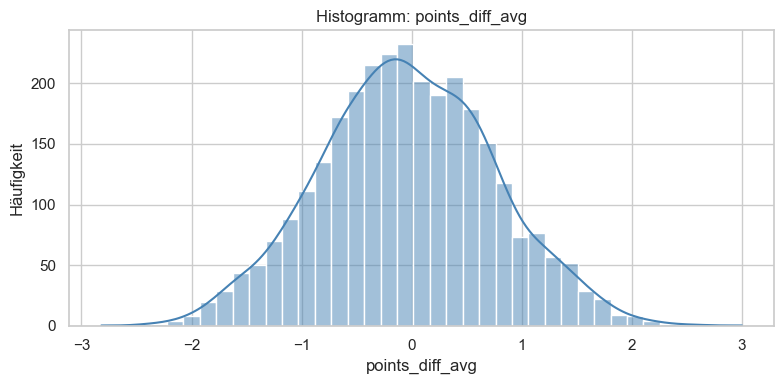

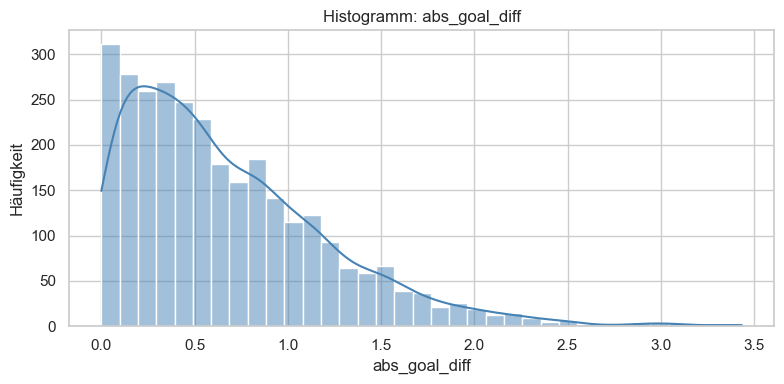

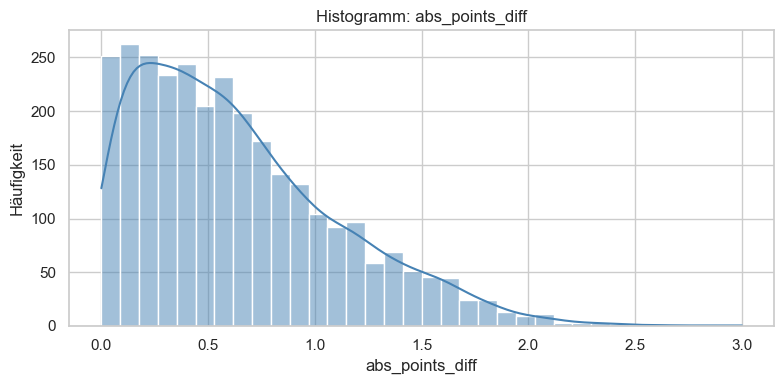

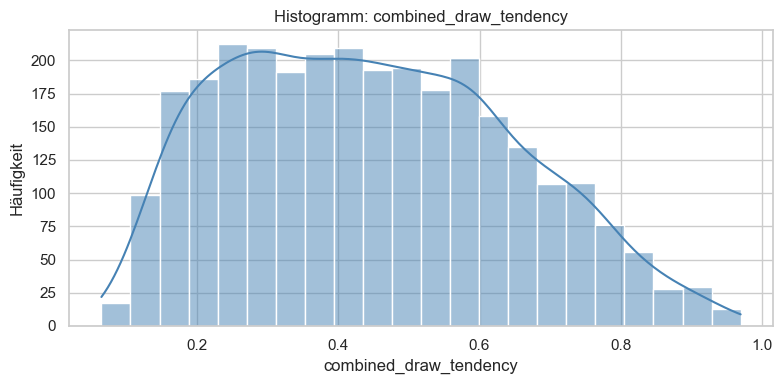


Plotte Histogramme für XG_FEATURES (zusätzliche xG-Variablen)...



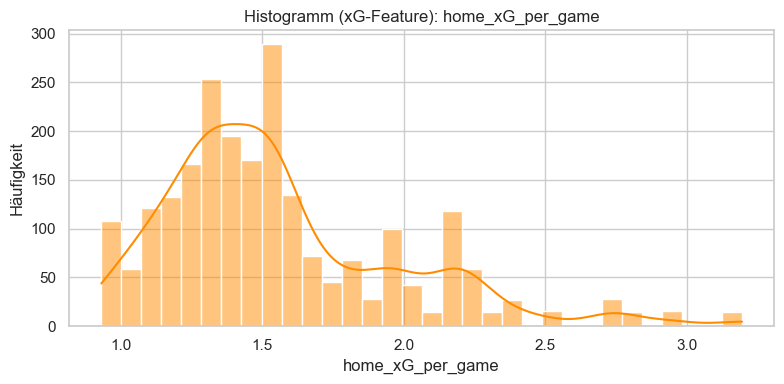

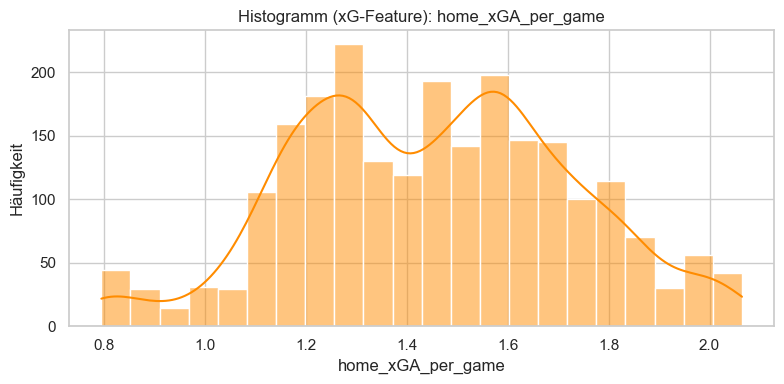

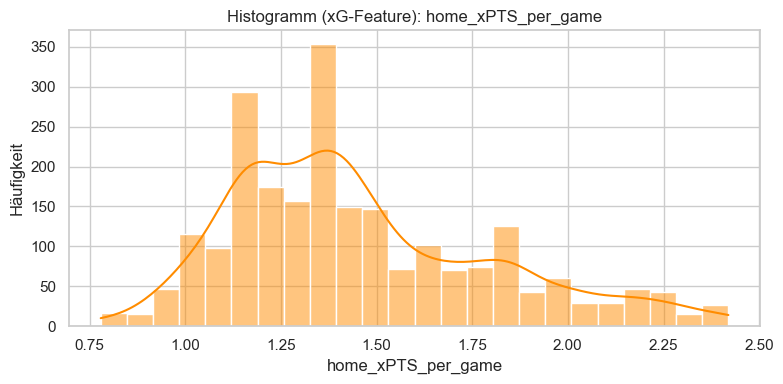

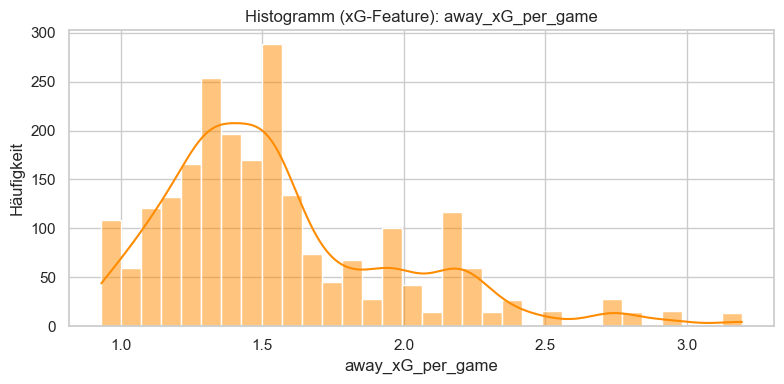

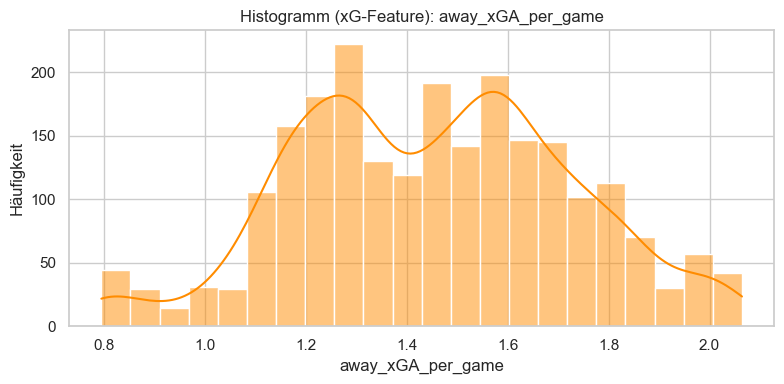

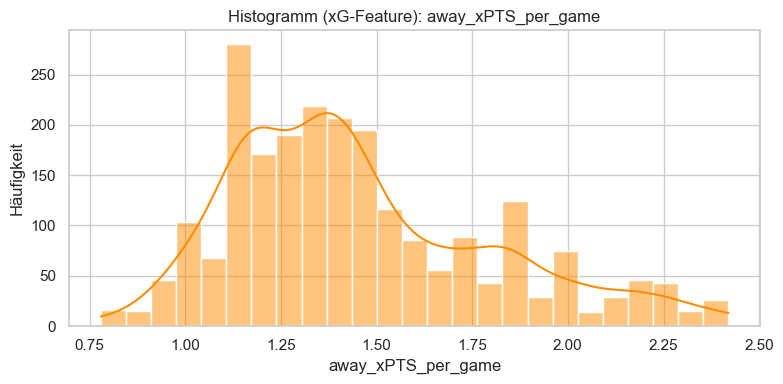

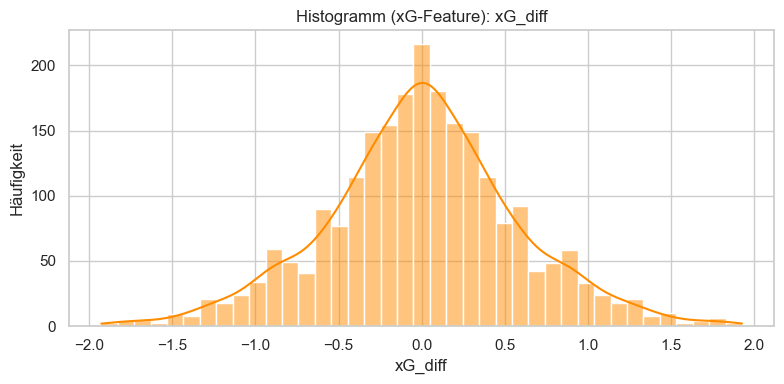

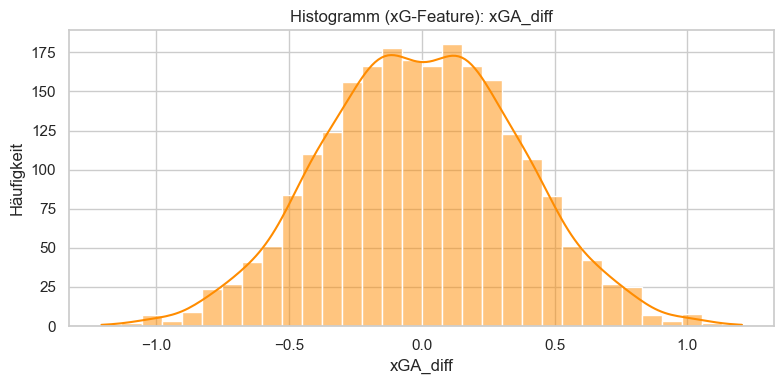

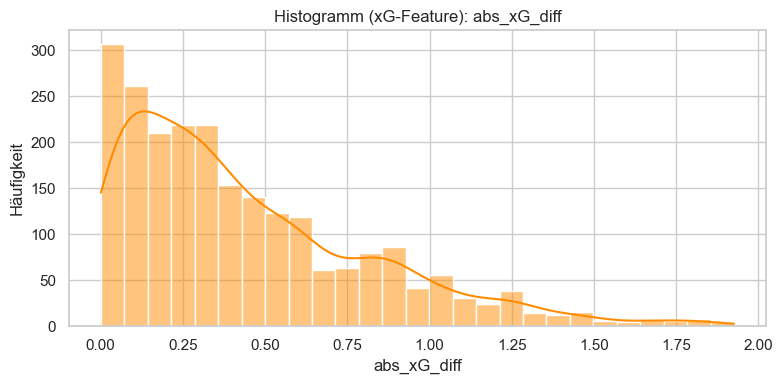

In [4]:
# --- 2.2 Histogramm für jede Variable (BASE_FEATURES) ---
print(f"Plotte {len(BASE_FEATURES)} Histogramme für BASE_FEATURES...\n")

for feature in BASE_FEATURES:
    fig, ax = plt.subplots(figsize=(8, 4))
    sns.histplot(data=df_base, x=feature, kde=True, color='steelblue', ax=ax)
    ax.set_title(f"Histogramm: {feature}")
    ax.set_xlabel(feature)
    ax.set_ylabel("Häufigkeit")
    plt.tight_layout()
    plt.show()

print("\nPlotte Histogramme für XG_FEATURES (zusätzliche xG-Variablen)...\n")
# Nur die Features, die in XG_FEATURES aber nicht in BASE_FEATURES sind
extra_xg_features = [f for f in XG_FEATURES if f not in BASE_FEATURES]

for feature in extra_xg_features:
    fig, ax = plt.subplots(figsize=(8, 4))
    sns.histplot(data=df_with_xg, x=feature, kde=True, color='darkorange', ax=ax)
    ax.set_title(f"Histogramm (xG-Feature): {feature}")
    ax.set_xlabel(feature)
    ax.set_ylabel("Häufigkeit")
    plt.tight_layout()
    plt.show()

### 2.3 Boxplots – Ausreißer & Streuung jeder Variable
### 2.4 Feature vs. Zielvariable (FTR) – Gruppierte Boxplots


Plotte 25 Boxplots für BASE_FEATURES...



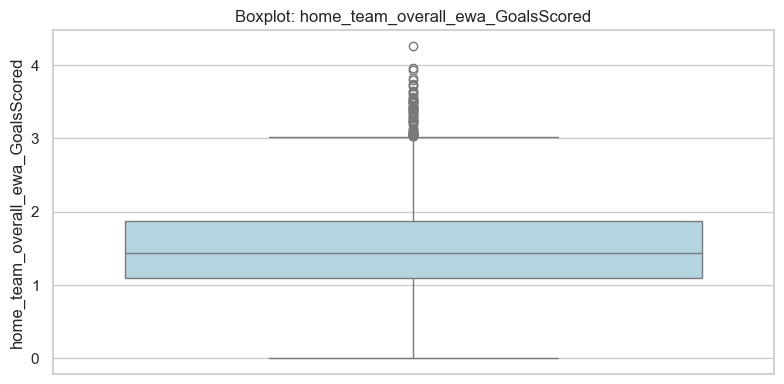

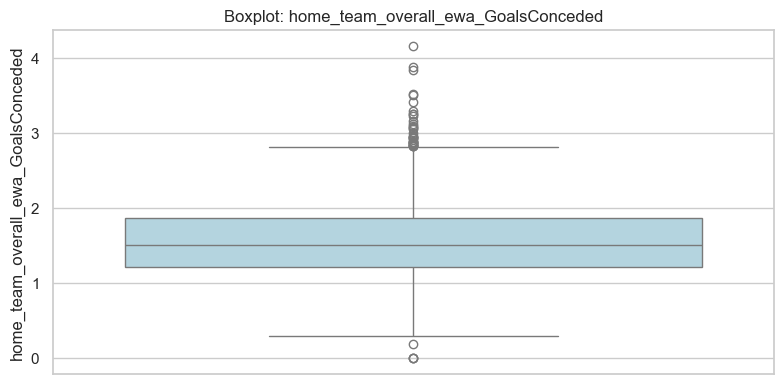

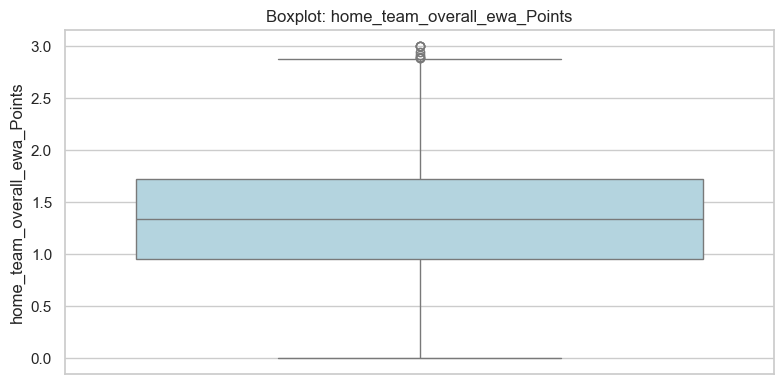

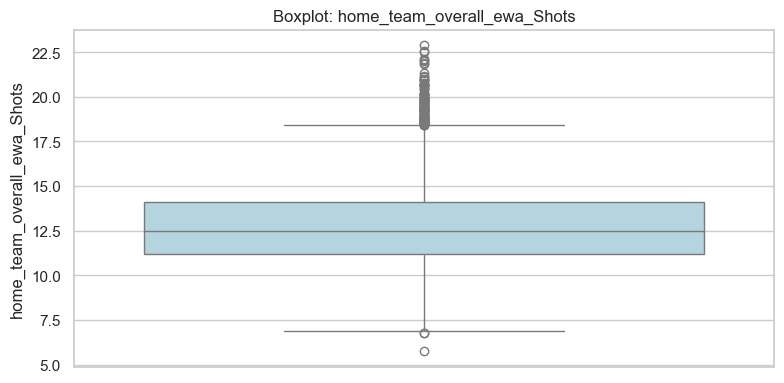

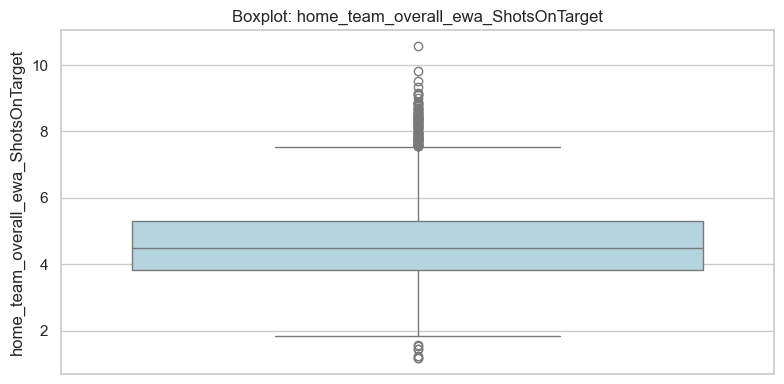

...

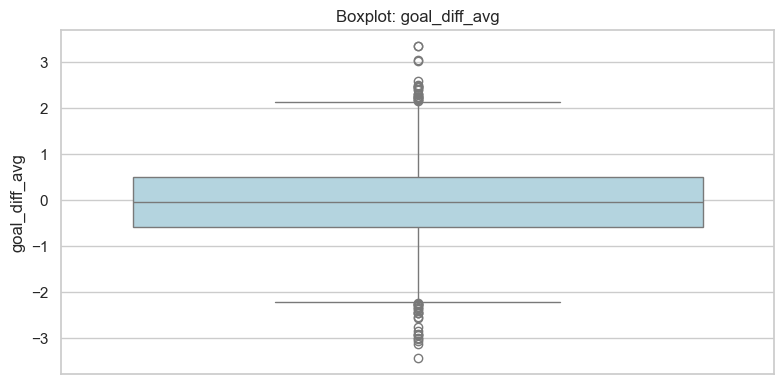

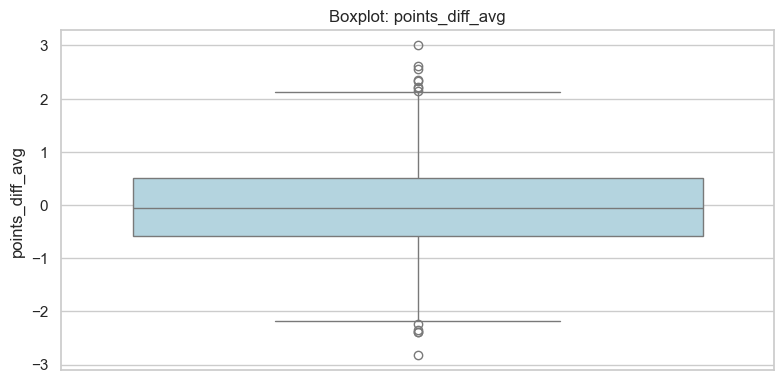

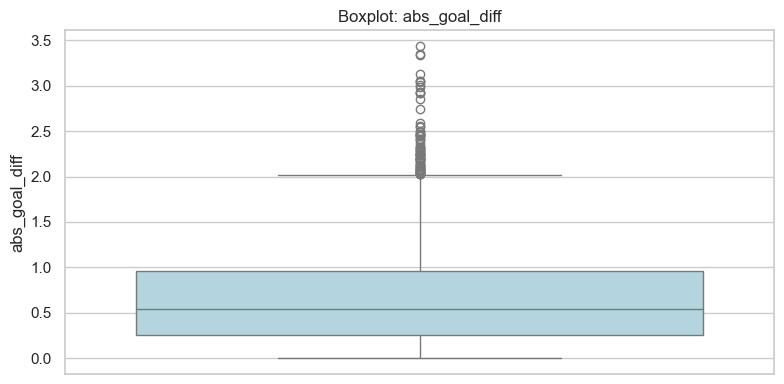

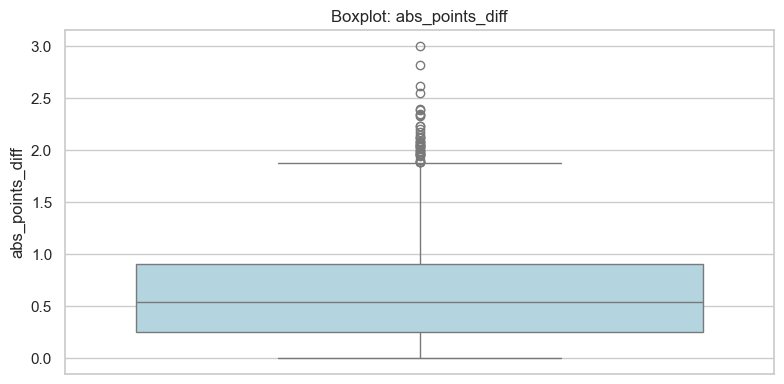

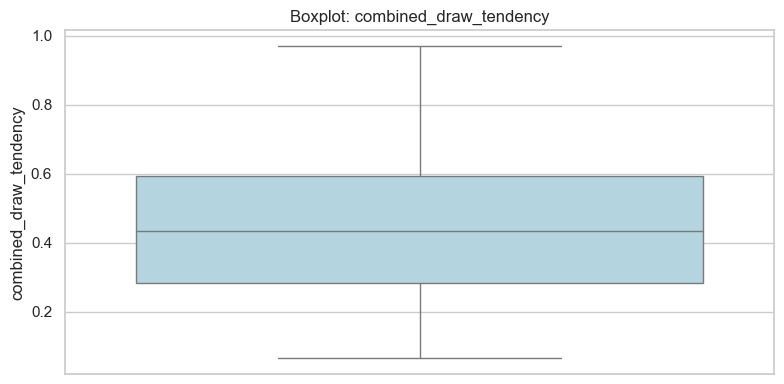


Plotte Boxplots für XG_FEATURES (zusätzliche xG-Variablen)...



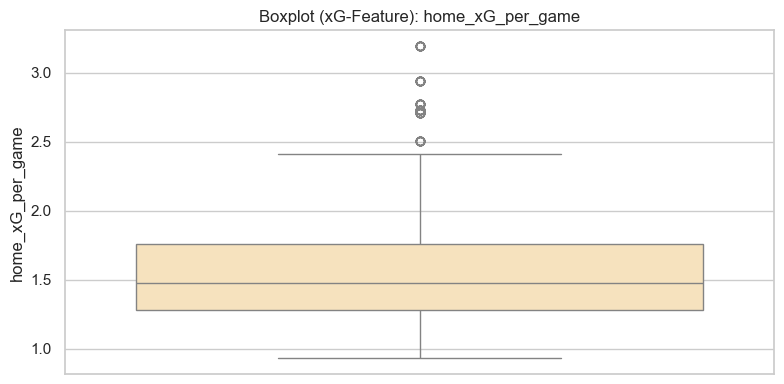

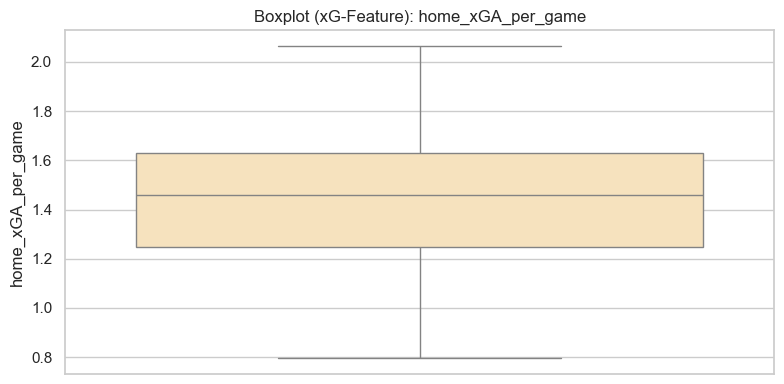

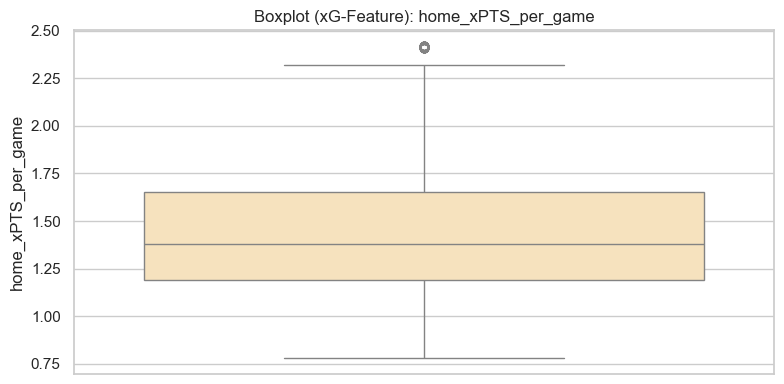

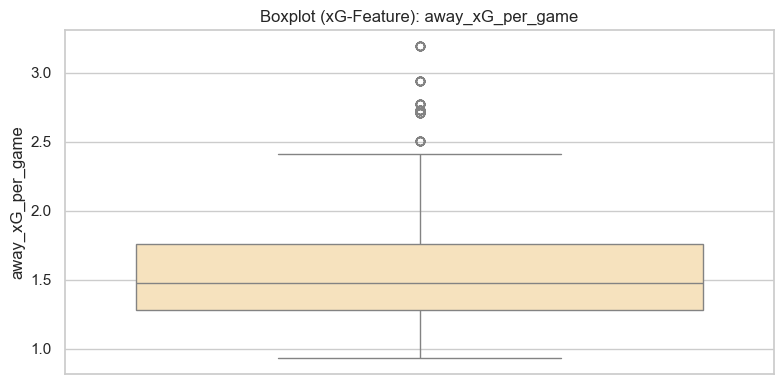

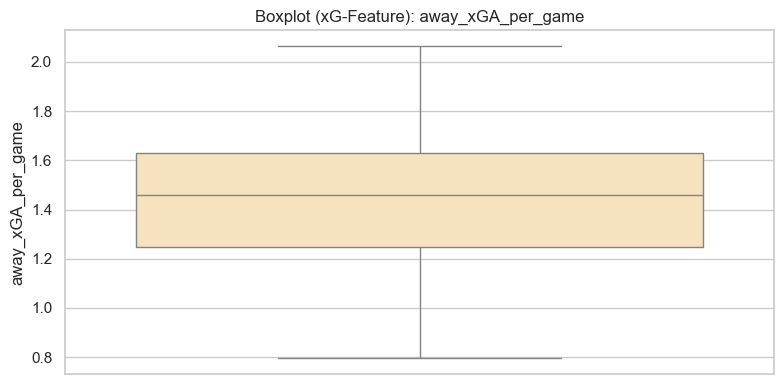

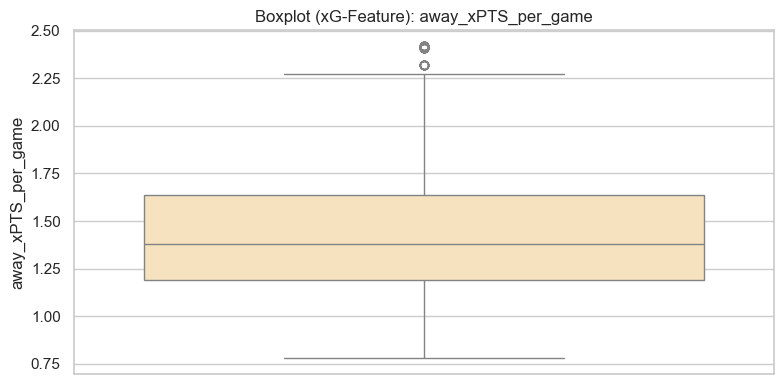

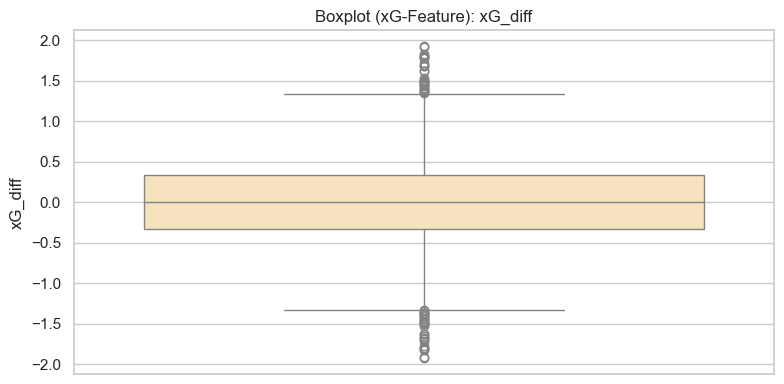

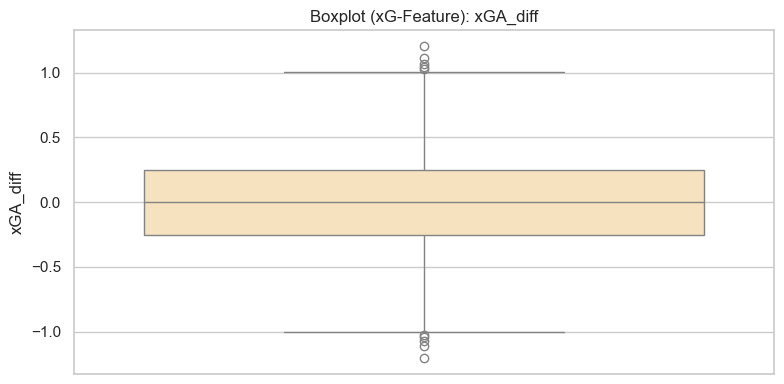

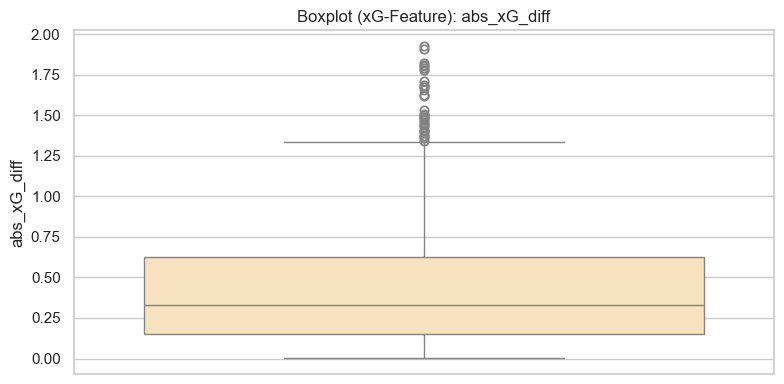


Plotte Zusammenhang jedes Features mit der Zielvariable FTR (gruppierte Boxplots)...



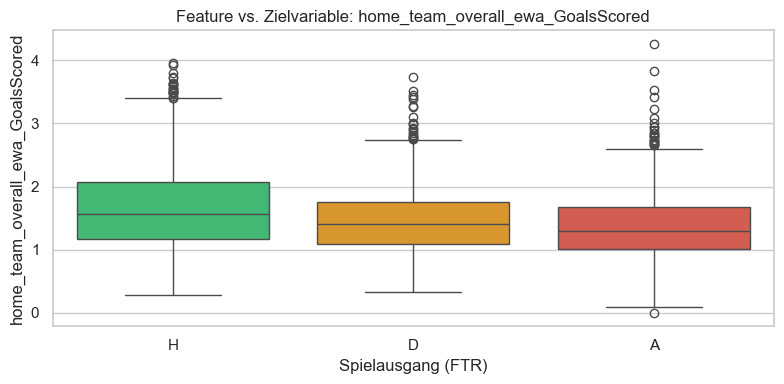

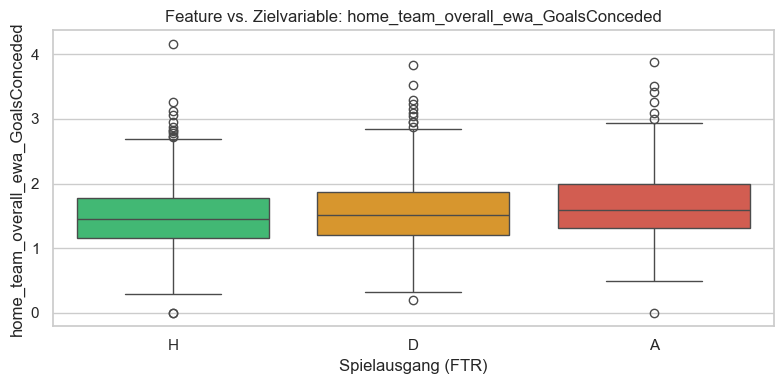

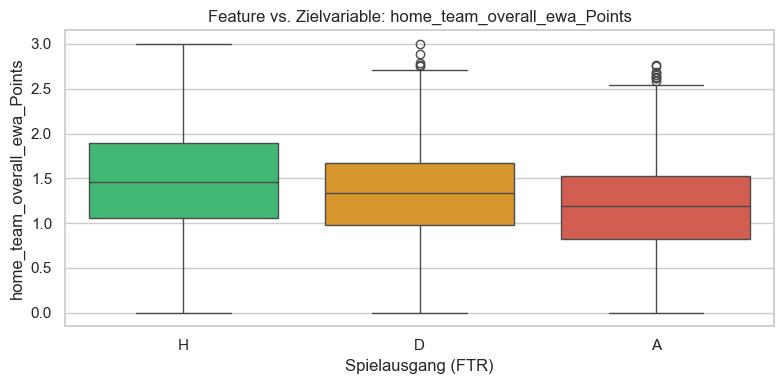

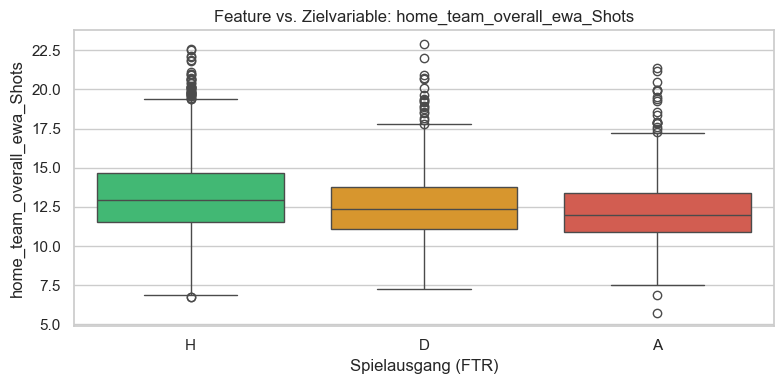

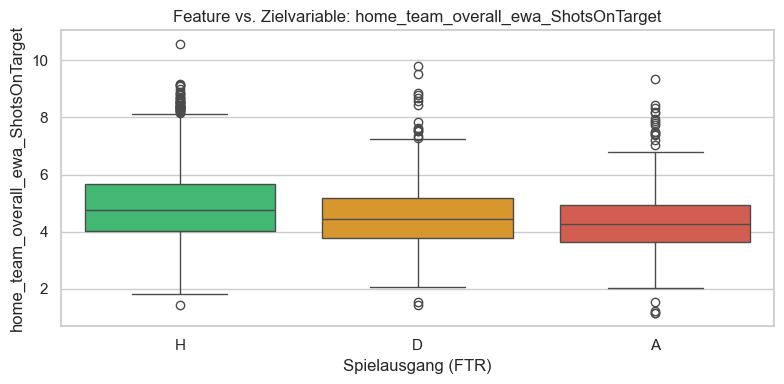

...

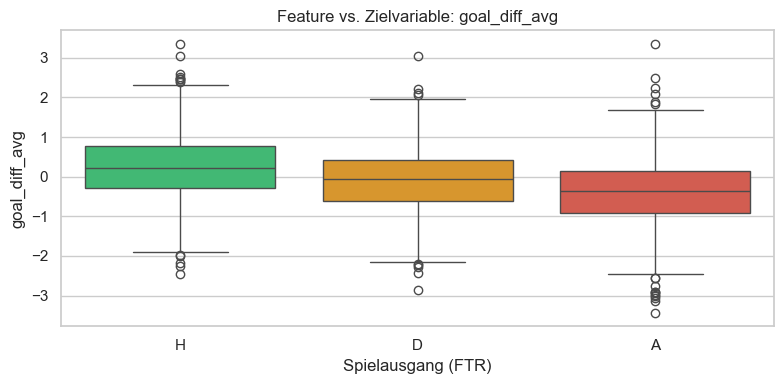

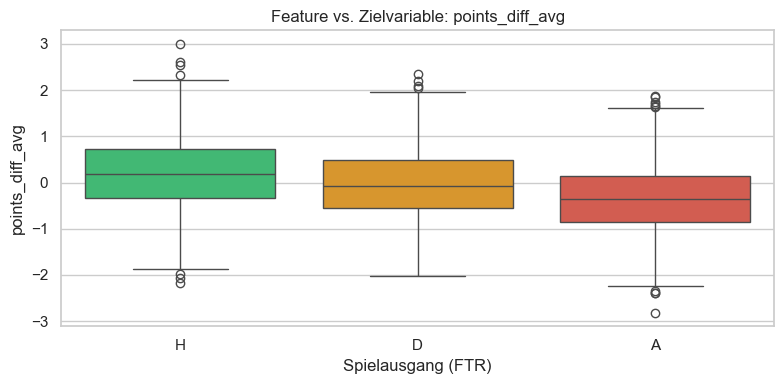

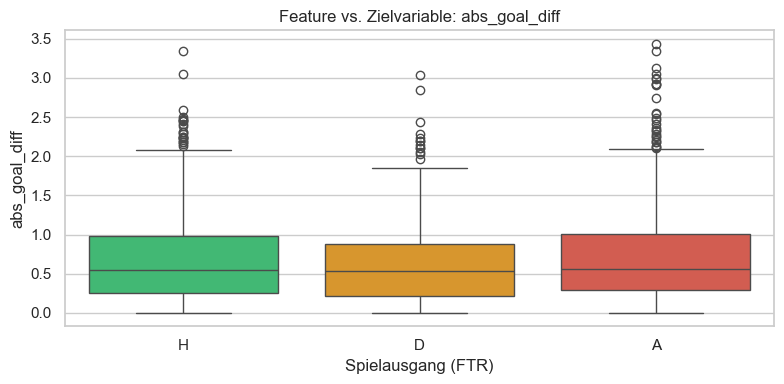

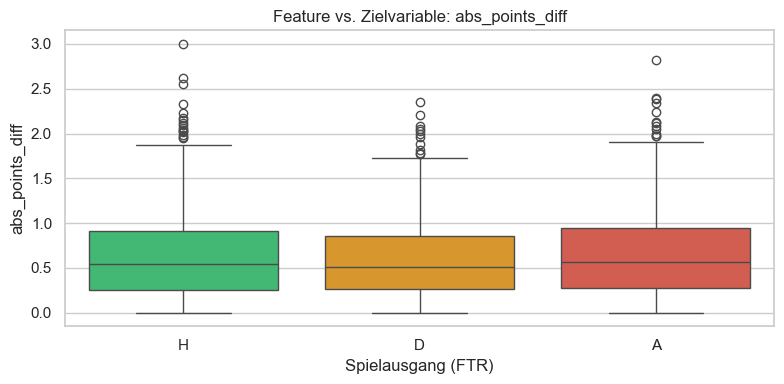

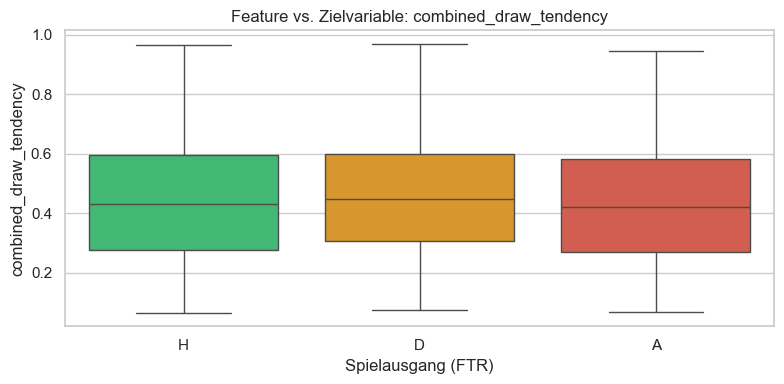


Selbiges für xG-Features...



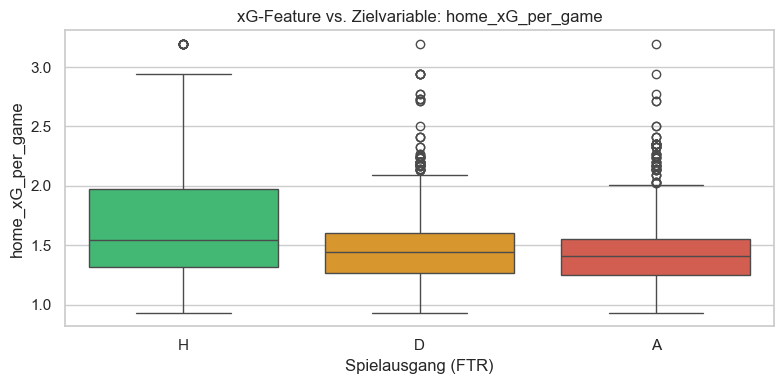

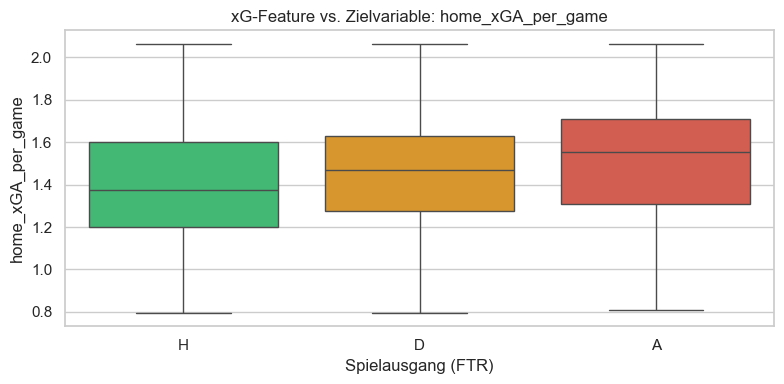

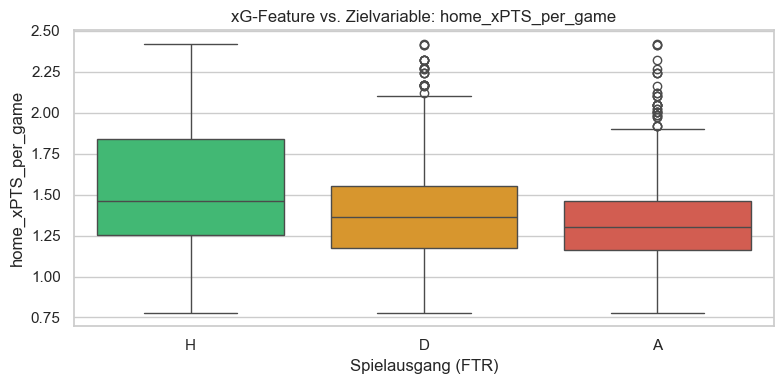

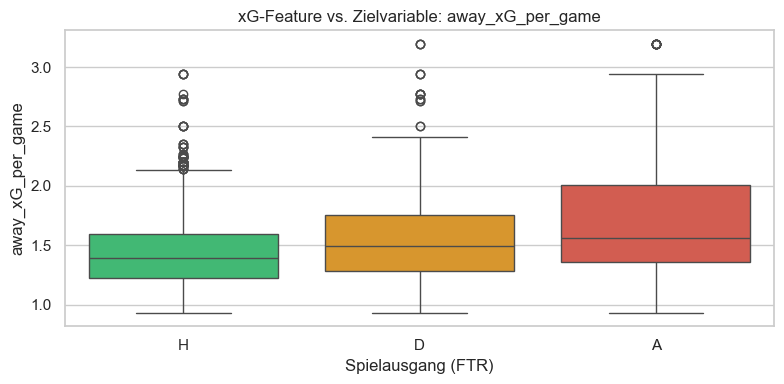

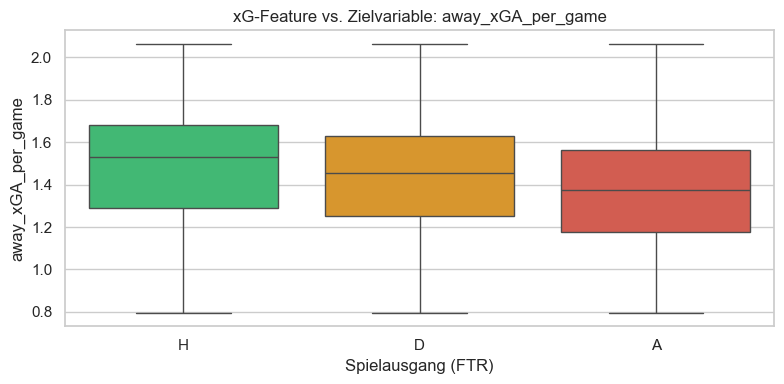

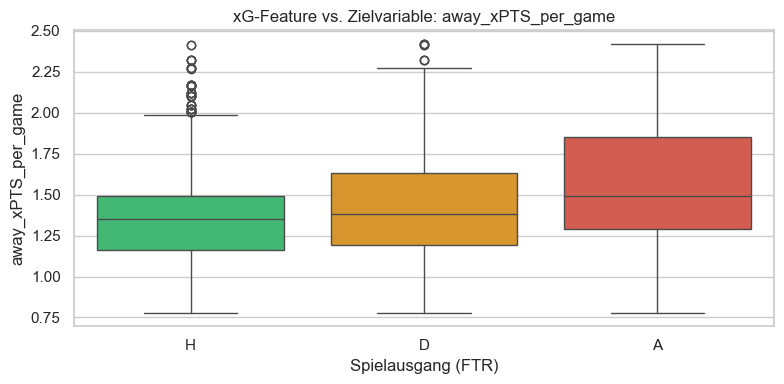

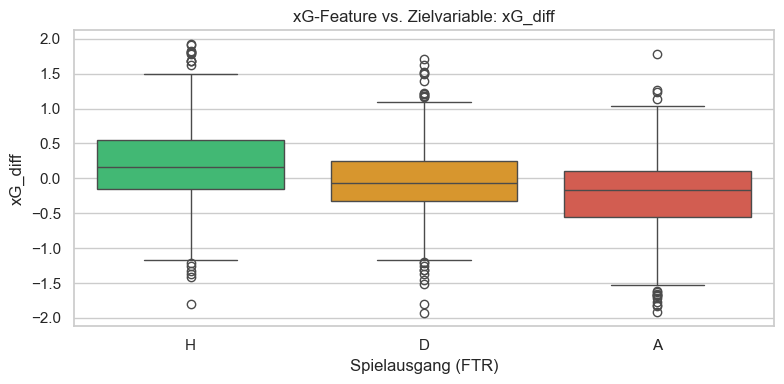

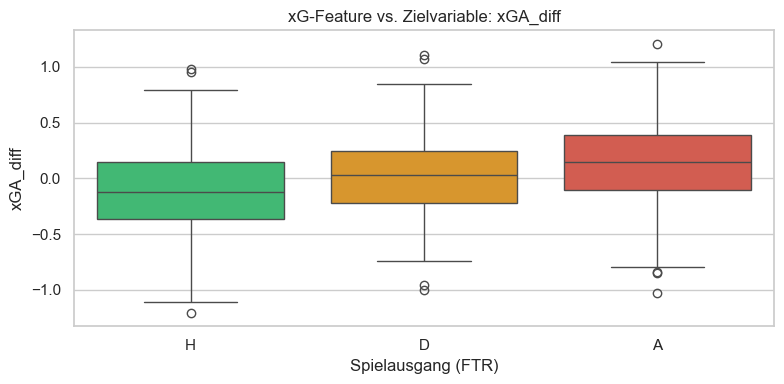

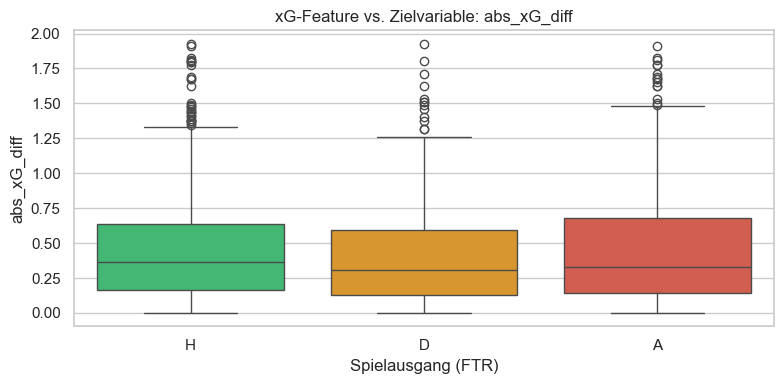

In [5]:
# --- 2.3 Boxplot für jede Variable (einzeln) ---
print(f"Plotte {len(BASE_FEATURES)} Boxplots für BASE_FEATURES...\n")

for feature in BASE_FEATURES:
    fig, ax = plt.subplots(figsize=(8, 4))
    sns.boxplot(data=df_base, y=feature, color='lightblue', ax=ax)
    ax.set_title(f"Boxplot: {feature}")
    ax.set_ylabel(feature)
    plt.tight_layout()
    plt.show()

extra_xg_features = [f for f in XG_FEATURES if f not in BASE_FEATURES]
print("\nPlotte Boxplots für XG_FEATURES (zusätzliche xG-Variablen)...\n")

for feature in extra_xg_features:
    fig, ax = plt.subplots(figsize=(8, 4))
    sns.boxplot(data=df_with_xg, y=feature, color='moccasin', ax=ax)
    ax.set_title(f"Boxplot (xG-Feature): {feature}")
    ax.set_ylabel(feature)
    plt.tight_layout()
    plt.show()

# --- 2.4 Zusammenhang jeder Variable zur Zielvariable (FTR) ---
print(f"\nPlotte Zusammenhang jedes Features mit der Zielvariable FTR (gruppierte Boxplots)...\n")

for feature in BASE_FEATURES:
    fig, ax = plt.subplots(figsize=(8, 4))
    sns.boxplot(data=df_base, x='FTR', y=feature,
                order=['H', 'D', 'A'], hue='FTR', legend=False,
                palette={'H': '#2ecc71', 'D': '#f39c12', 'A': '#e74c3c'}, ax=ax)
    ax.set_title(f"Feature vs. Zielvariable: {feature}")
    ax.set_xlabel("Spielausgang (FTR)")
    ax.set_ylabel(feature)
    plt.tight_layout()
    plt.show()

print("\nSelbiges für xG-Features...\n")
for feature in extra_xg_features:
    fig, ax = plt.subplots(figsize=(8, 4))
    sns.boxplot(data=df_with_xg, x='FTR', y=feature,
                order=['H', 'D', 'A'], hue='FTR', legend=False,
                palette={'H': '#2ecc71', 'D': '#f39c12', 'A': '#e74c3c'}, ax=ax)
    ax.set_title(f"xG-Feature vs. Zielvariable: {feature}")
    ax.set_xlabel("Spielausgang (FTR)")
    ax.set_ylabel(feature)
    plt.tight_layout()
    plt.show()

### 2.5 Korrelationsanalyse
Pearson-Korrelationsmatrix aller Features sowie sortierter Barplot der Korrelation jedes Features mit der Zielvariable `Target_Heimerfolg`.

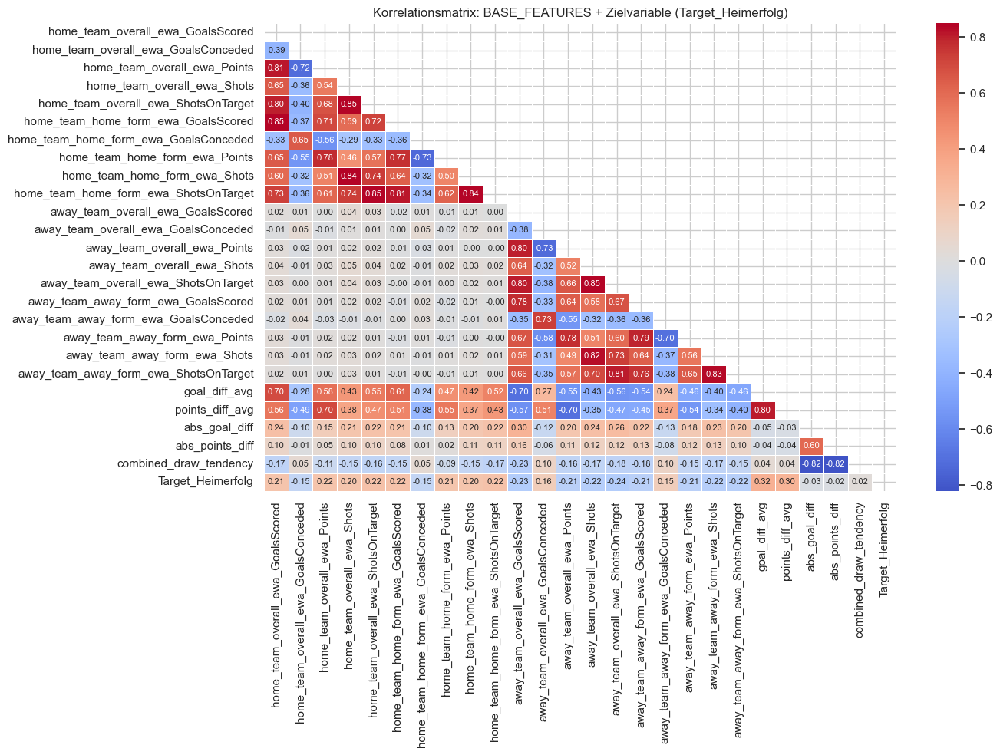

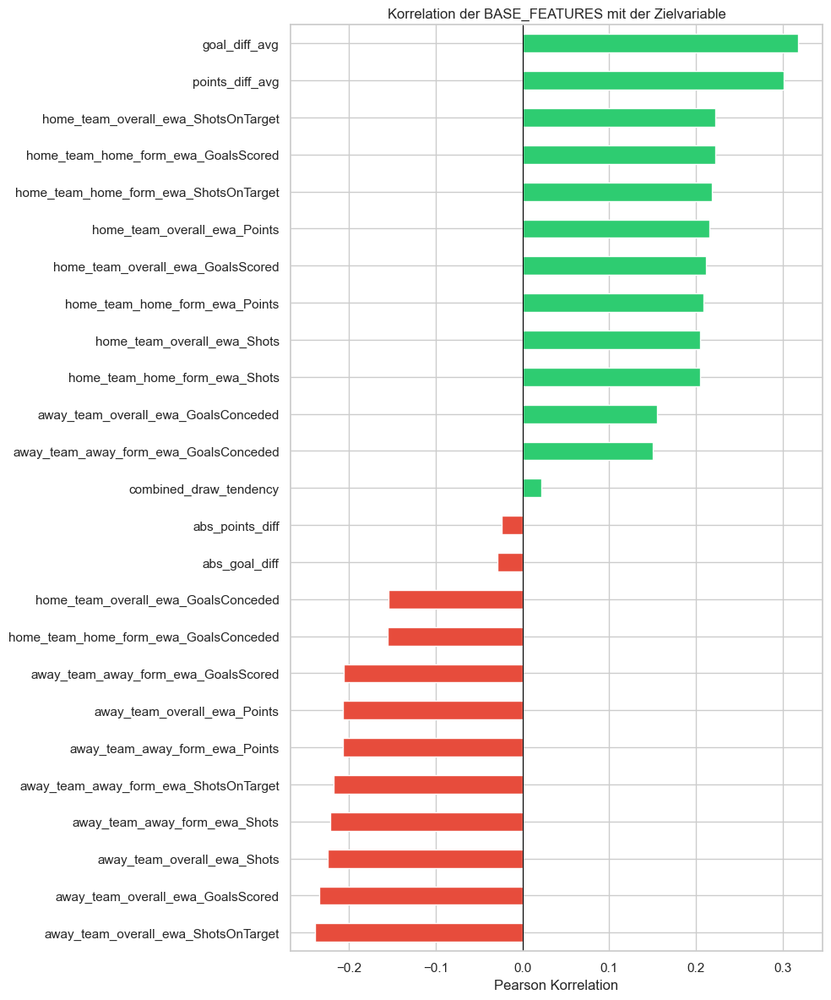

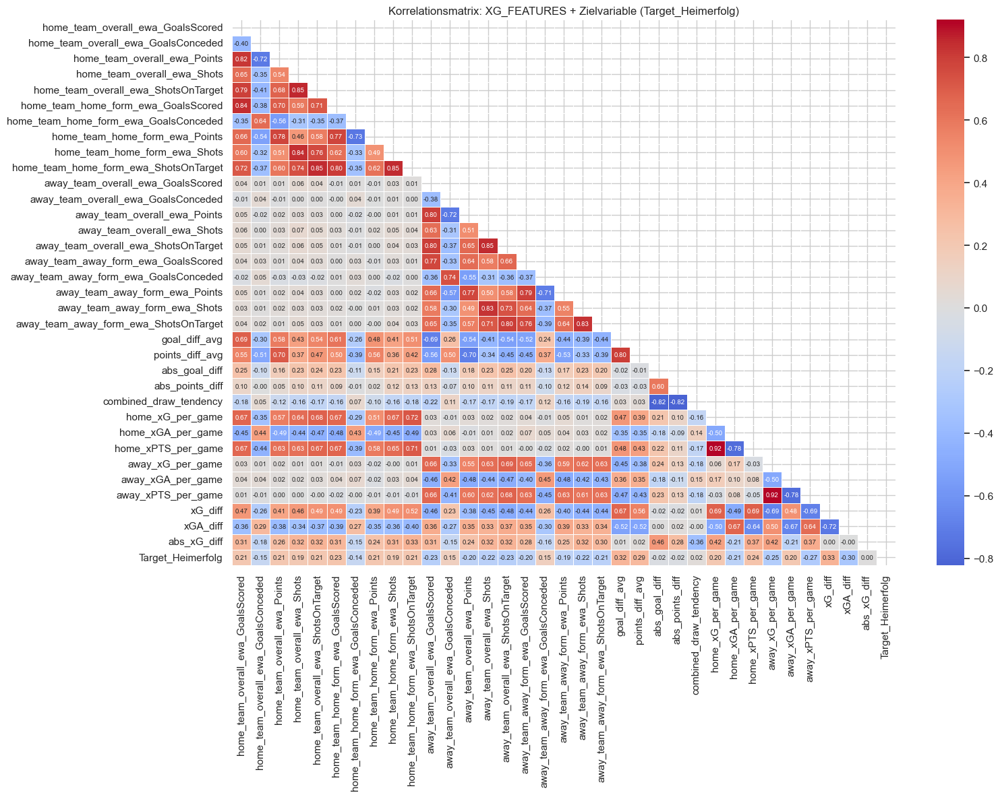

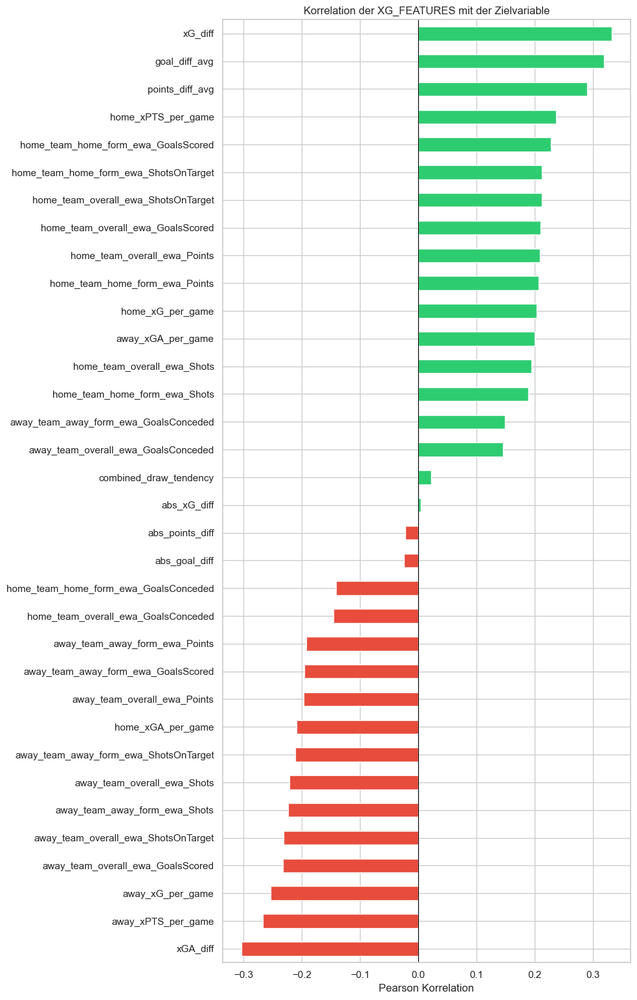

In [6]:
# --- 2.5 Korrelationsmatrix ---

# Base Features
plt.figure(figsize=(14, 10))
corr_base = df_base[BASE_FEATURES + ['Target_Heimerfolg']].corr()
mask = np.zeros_like(corr_base, dtype=bool)
mask[np.triu_indices_from(mask)] = True          # oberes Dreieck ausblenden
sns.heatmap(
    corr_base, mask=mask, cmap='coolwarm', center=0,
    annot=True, fmt=".2f", linewidths=0.5,
    annot_kws={"size": 8}
)
plt.title("Korrelationsmatrix: BASE_FEATURES + Zielvariable (Target_Heimerfolg)")
plt.tight_layout()
plt.show()

# Korrelation jedes Features mit der Zielvariable — als sortierter Barplot
corr_target_base = corr_base['Target_Heimerfolg'].drop('Target_Heimerfolg').sort_values()
fig, ax = plt.subplots(figsize=(10, len(BASE_FEATURES) * 0.4 + 2))
colors = ['#e74c3c' if v < 0 else '#2ecc71' for v in corr_target_base]
corr_target_base.plot(kind='barh', color=colors, ax=ax)
ax.axvline(0, color='black', linewidth=0.8)
ax.set_title("Korrelation der BASE_FEATURES mit der Zielvariable")
ax.set_xlabel("Pearson Korrelation")
plt.tight_layout()
plt.show()

# xG Features
plt.figure(figsize=(16, 12))
corr_xg = df_with_xg[XG_FEATURES + ['Target_Heimerfolg']].corr()
mask_xg = np.zeros_like(corr_xg, dtype=bool)
mask_xg[np.triu_indices_from(mask_xg)] = True
sns.heatmap(
    corr_xg, mask=mask_xg, cmap='coolwarm', center=0,
    annot=True, fmt=".2f", linewidths=0.5,
    annot_kws={"size": 7}
)
plt.title("Korrelationsmatrix: XG_FEATURES + Zielvariable (Target_Heimerfolg)")
plt.tight_layout()
plt.show()

# Korrelation xG-Features mit Zielvariable
corr_target_xg = corr_xg['Target_Heimerfolg'].drop('Target_Heimerfolg').sort_values()
fig, ax = plt.subplots(figsize=(10, len(XG_FEATURES) * 0.4 + 2))
colors_xg = ['#e74c3c' if v < 0 else '#2ecc71' for v in corr_target_xg]
corr_target_xg.plot(kind='barh', color=colors_xg, ax=ax)
ax.axvline(0, color='black', linewidth=0.8)
ax.set_title("Korrelation der XG_FEATURES mit der Zielvariable")
ax.set_xlabel("Pearson Korrelation")
plt.tight_layout()
plt.show()

### 2.5.1 Zusammenhang Input-Features → Zielvariable (Scatterplot + Regression)
Für jedes Feature wird ein Stripplot (Punkte je FTR-Klasse) kombiniert mit einem Mittelwert-Punkt gezeigt, um den Trend pro Klasse auf einen Blick zu erkennen.

BASE_FEATURES vs. Zielvariable FTR



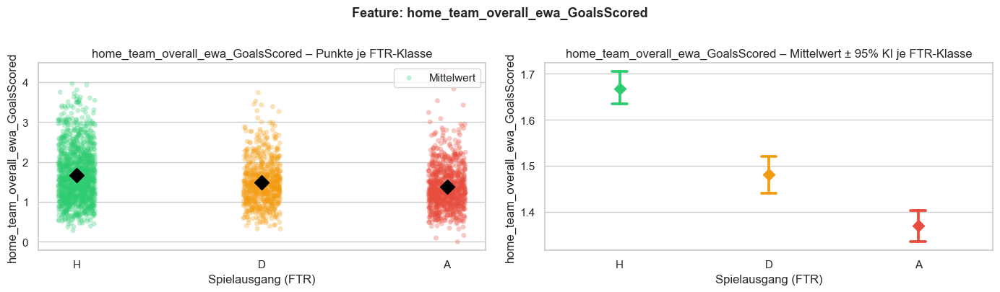

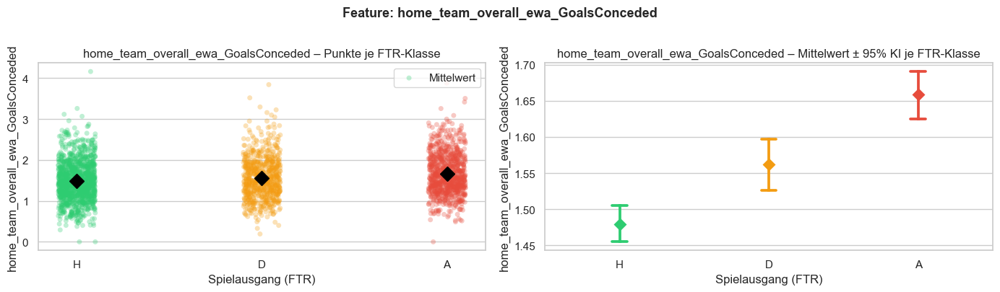

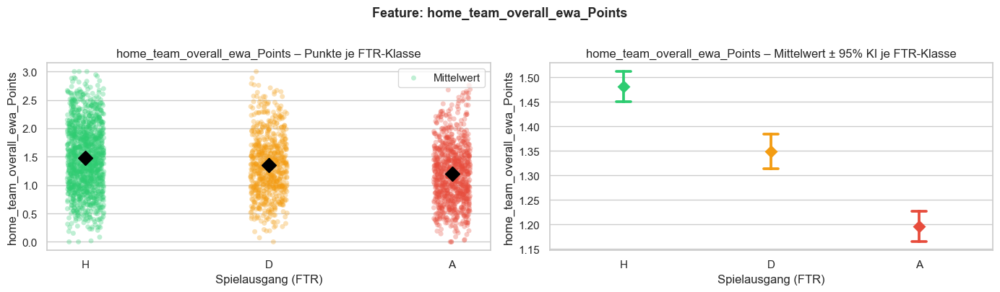

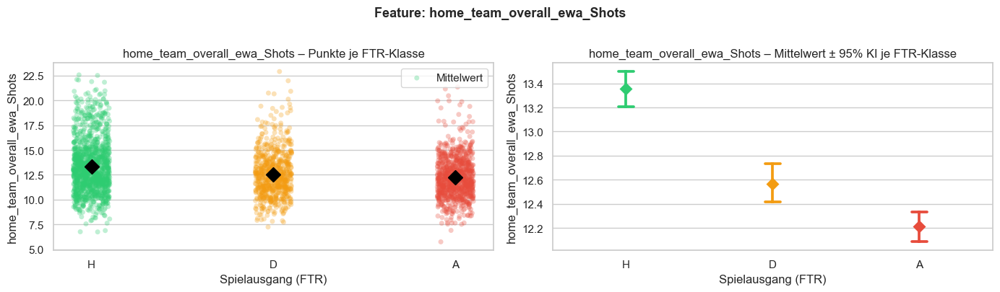

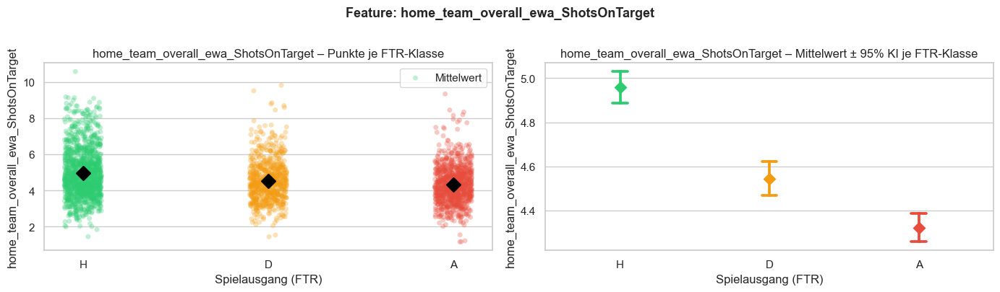

...

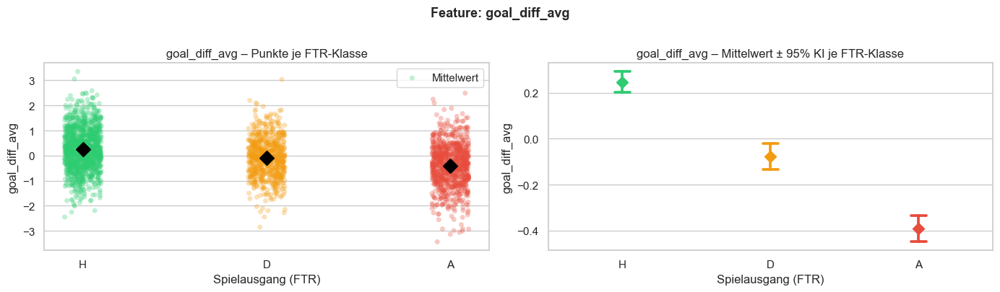

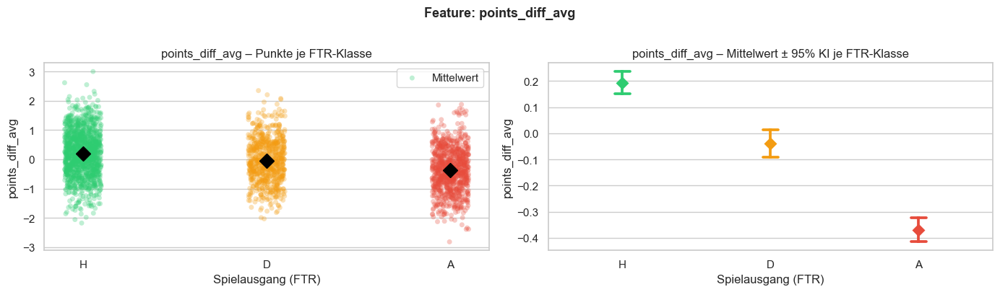

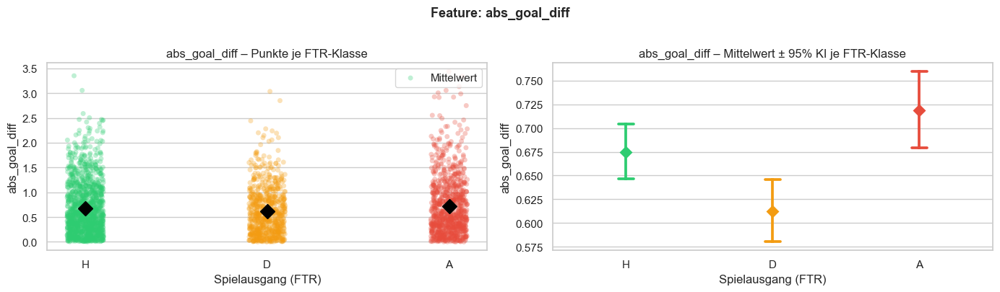

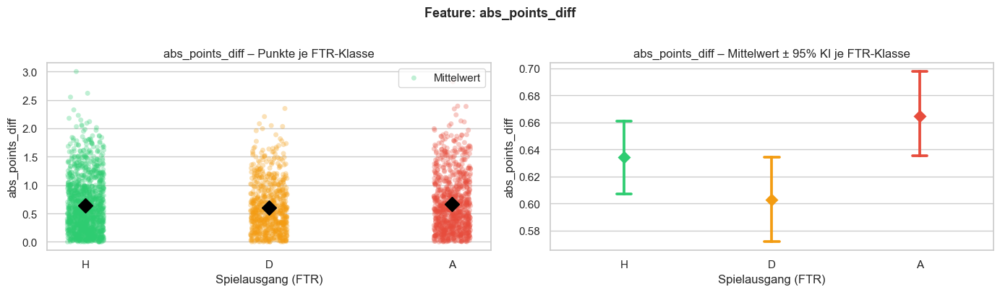

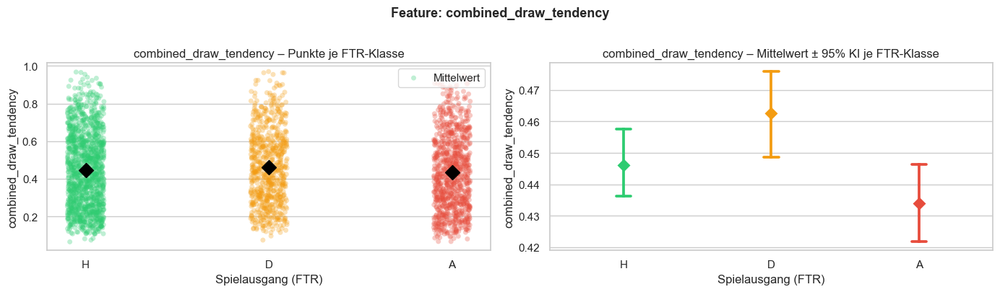


xG-FEATURES vs. Zielvariable FTR



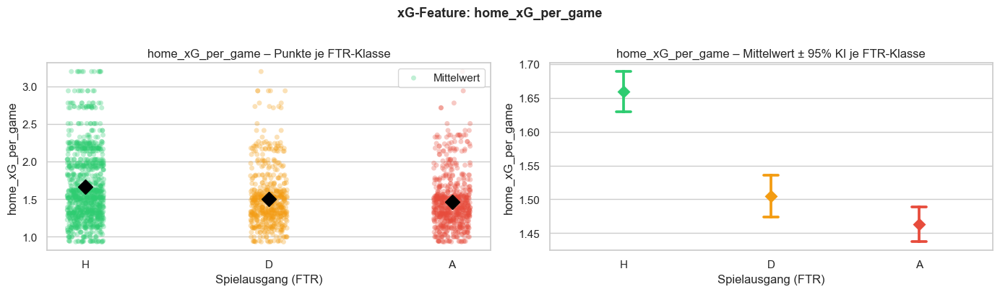

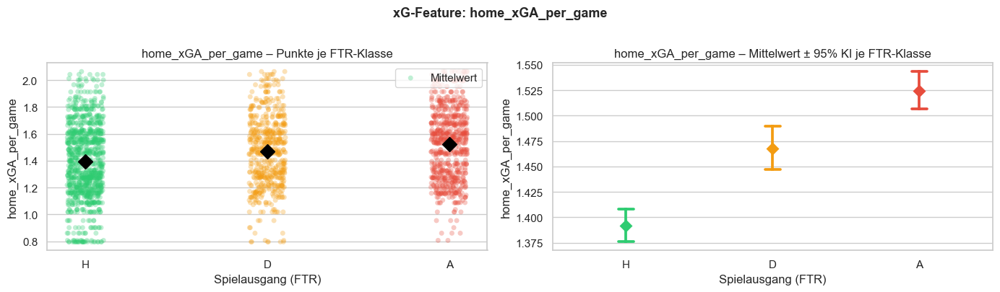

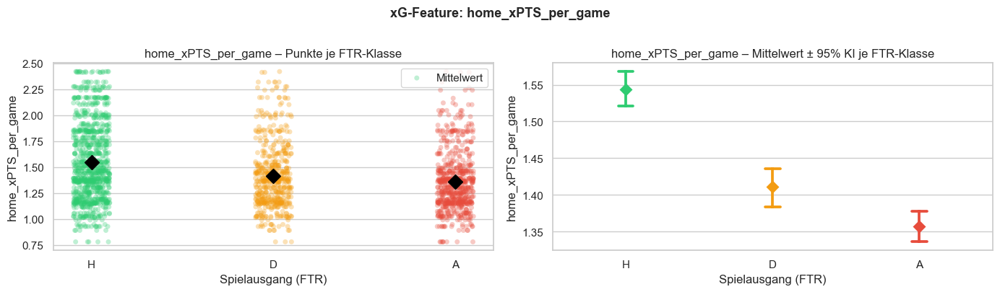

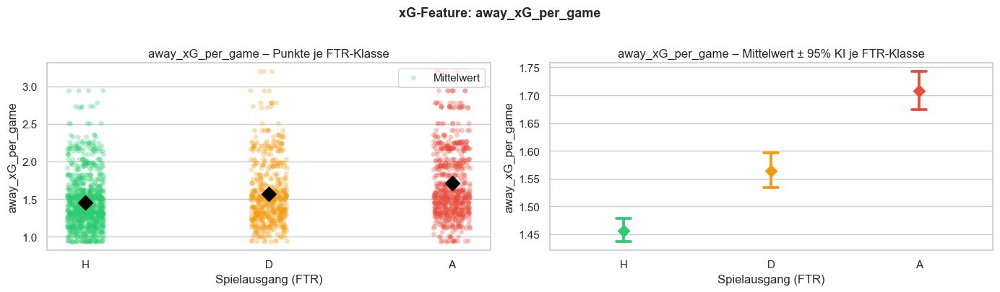

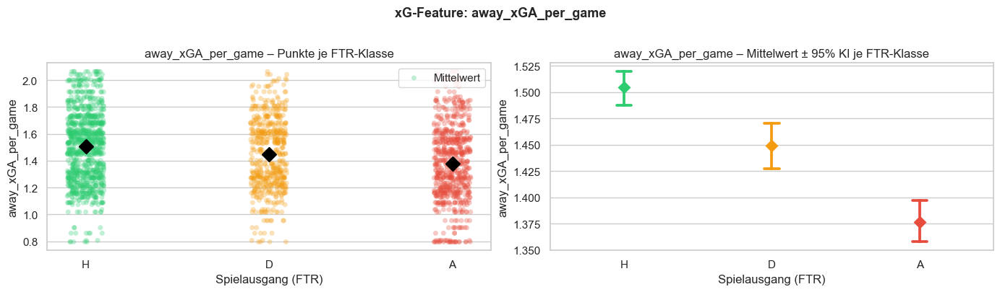

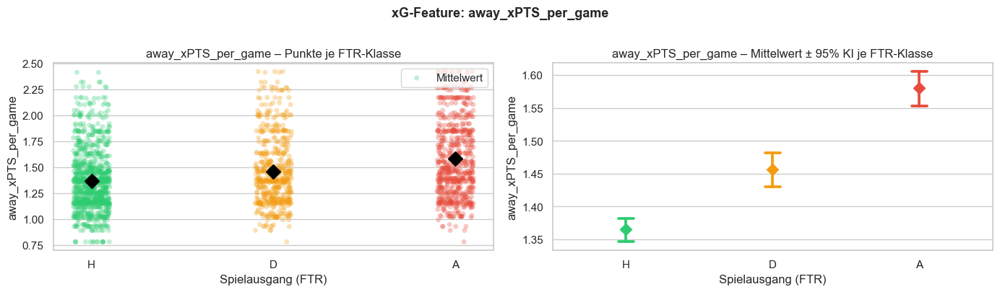

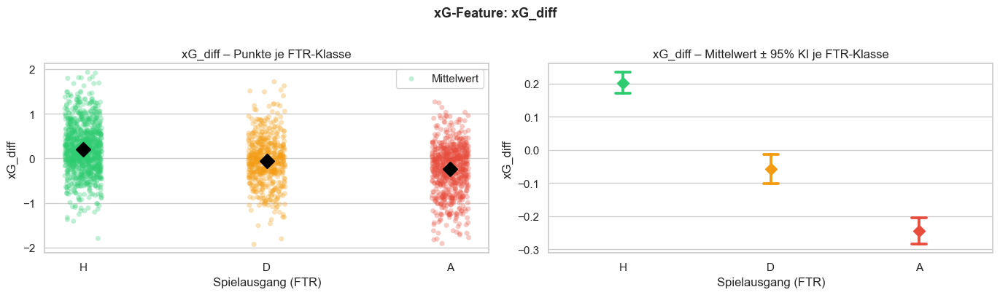

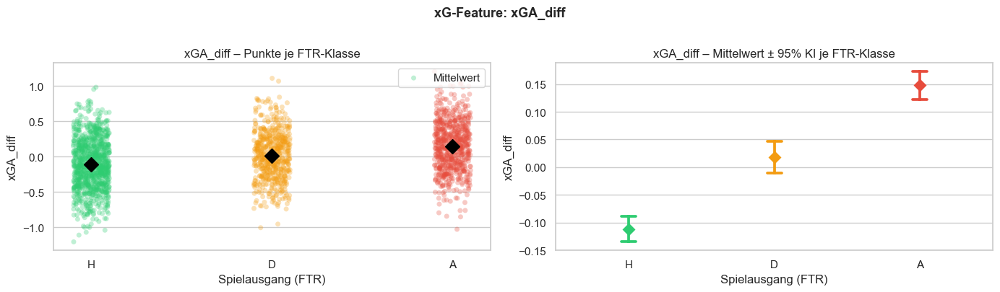

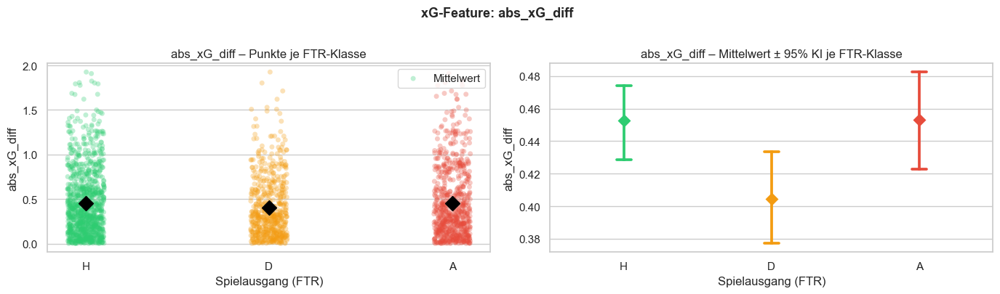

In [7]:
# --- 2.5.1 Zusammenhang jedes Features mit der Zielvariable ---
# Kombiniert: Stripplot (Datenpunkte) + Mittelwert pro FTR-Klasse + Trendlinie

palette = {'H': '#2ecc71', 'D': '#f39c12', 'A': '#e74c3c'}
order = ['H', 'D', 'A']

print("BASE_FEATURES vs. Zielvariable FTR\n")
for feature in BASE_FEATURES:
    fig, axes = plt.subplots(1, 2, figsize=(14, 4))

    # --- Linke Grafik: Stripplot + Mittelwerte ---
    sns.stripplot(data=df_base, x='FTR', y=feature, order=order,
                  hue='FTR', palette=palette, alpha=0.3, jitter=True,
                  legend=False, ax=axes[0])
    # Mittelwert je Klasse einzeichnen
    means = df_base.groupby('FTR')[feature].mean()
    for i, klasse in enumerate(order):
        axes[0].plot(i, means[klasse], marker='D', markersize=10,
                     color='black', zorder=5, label='Mittelwert' if i == 0 else "")
    axes[0].legend(["Mittelwert"], loc='upper right')
    axes[0].set_title(f"{feature} – Punkte je FTR-Klasse")
    axes[0].set_xlabel("Spielausgang (FTR)")
    axes[0].set_ylabel(feature)

    # --- Rechte Grafik: Mittelwert + 95%-Konfidenzintervall (Pointplot) ---
    sns.pointplot(data=df_base, x='FTR', y=feature, order=order,
                  hue='FTR', palette=palette, markers='D',
                  linestyles='--', legend=False,
                  errorbar=('ci', 95), capsize=0.1, ax=axes[1])
    axes[1].set_title(f"{feature} – Mittelwert ± 95% KI je FTR-Klasse")
    axes[1].set_xlabel("Spielausgang (FTR)")
    axes[1].set_ylabel(feature)

    plt.suptitle(f"Feature: {feature}", fontsize=13, fontweight='bold', y=1.01)
    plt.tight_layout()
    plt.show()

print("\nxG-FEATURES vs. Zielvariable FTR\n")
extra_xg_features = [f for f in XG_FEATURES if f not in BASE_FEATURES]

for feature in extra_xg_features:
    fig, axes = plt.subplots(1, 2, figsize=(14, 4))

    sns.stripplot(data=df_with_xg, x='FTR', y=feature, order=order,
                  hue='FTR', palette=palette, alpha=0.3, jitter=True,
                  legend=False, ax=axes[0])
    means = df_with_xg.groupby('FTR')[feature].mean()
    for i, klasse in enumerate(order):
        axes[0].plot(i, means[klasse], marker='D', markersize=10,
                     color='black', zorder=5, label='Mittelwert' if i == 0 else "")
    axes[0].legend(["Mittelwert"], loc='upper right')
    axes[0].set_title(f"{feature} – Punkte je FTR-Klasse")
    axes[0].set_xlabel("Spielausgang (FTR)")
    axes[0].set_ylabel(feature)

    sns.pointplot(data=df_with_xg, x='FTR', y=feature, order=order,
                  hue='FTR', palette=palette, markers='D',
                  linestyles='--', legend=False,
                  errorbar=('ci', 95), capsize=0.1, ax=axes[1])
    axes[1].set_title(f"{feature} – Mittelwert ± 95% KI je FTR-Klasse")
    axes[1].set_xlabel("Spielausgang (FTR)")
    axes[1].set_ylabel(feature)

    plt.suptitle(f"xG-Feature: {feature}", fontsize=13, fontweight='bold', y=1.01)
    plt.tight_layout()
    plt.show()

## 3. Dataframe-Varianten erstellen

Wir kodieren nun die Zielvariable für das Modell endgültig als Kategorien-Index.
Danach bilden wir verschiedene DataFrames:
- **Unbereinigt** (`df_raw`): Nur die NaNs sind weg.
- **Ohne Ausreißer** (`df_clean`): Werte weiter als 3*IQR vom Median werden entfernt.

Und für jede Auswahl:
- **Alle Variablen**
- **Stark korrelierende Variablen**: Nur Variablen, die eine absolute Korrelation zur encodierten Zielvariable von > 0.1 aufweisen.

In [8]:
from sklearn.decomposition import PCA

le = LabelEncoder()
df_base['Target'] = le.fit_transform(df_base['FTR'])
df_with_xg['Target'] = le.transform(df_with_xg['FTR'])

# ── Hilfsfunktionen ────────────────────────────────────────────────────────────

def remove_outliers_iqr(df, features, multiplier=3.0):
    """Entfernt Ausreißer basierend auf dem IQR."""
    df_out = df.copy()
    for col in features:
        Q1 = df_out[col].quantile(0.25)
        Q3 = df_out[col].quantile(0.75)
        IQR = Q3 - Q1
        df_out = df_out[~((df_out[col] < (Q1 - multiplier * IQR)) |
                          (df_out[col] > (Q3 + multiplier * IQR)))]
    return df_out

def get_strong_features(df, features, target_col='Target_Heimerfolg', threshold=0.1):
    """Features mit |Korrelation| > threshold zur Zielvariable."""
    corr = df[features + [target_col]].corr()[target_col].abs()
    corr = corr.drop(target_col)
    strong = corr[corr > threshold].index.tolist()
    if len(strong) == 0:
        strong = corr.sort_values(ascending=False).head(5).index.tolist()
    return strong

def apply_pca(df, features, variance=0.95):
    """
    Wendet PCA auf die gegebenen Features an.
    Gibt einen neuen DataFrame mit den PCA-Komponenten zurück
    sowie die Anzahl der verwendeten Komponenten.
    """
    scaler_pca = StandardScaler()
    X_scaled = scaler_pca.fit_transform(df[features])
    pca = PCA(n_components=variance, random_state=42)
    X_pca = pca.fit_transform(X_scaled)
    n_components = pca.n_components_
    col_names = [f'PC{i+1}' for i in range(n_components)]
    df_pca = pd.DataFrame(X_pca, index=df.index, columns=col_names)
    df_pca['Target'] = df['Target'].values
    df_pca['FTR'] = df['FTR'].values
    return df_pca, col_names, n_components

# ── DataFrames aufbauen ────────────────────────────────────────────────────────

# Raw / Clean
df_base_raw   = df_base.copy()
df_xg_raw     = df_with_xg.copy()
df_base_clean = remove_outliers_iqr(df_base, BASE_FEATURES)
df_xg_clean   = remove_outliers_iqr(df_with_xg, XG_FEATURES)

# Starke Features
strong_base = get_strong_features(df_base_raw, BASE_FEATURES)
strong_xg   = get_strong_features(df_xg_raw,   XG_FEATURES)

print(f"Starke Base-Features  ({len(strong_base)}): {strong_base}")
print(f"Starke xG-Features    ({len(strong_xg)}):   {strong_xg}")

# ── PCA-Varianten erzeugen (Basis = Varianten 2, 4, 6, 8) ─────────────────────
# Variante 2:  Ohne xG | Raw   | Starke Features  → PCA auf strong_base, df_base_raw
# Variante 4:  Ohne xG | Clean | Starke Features  → PCA auf strong_base, df_base_clean
# Variante 6:  Mit xG  | Raw   | Starke Features  → PCA auf strong_xg,   df_xg_raw
# Variante 8:  Mit xG  | Clean | Starke Features  → PCA auf strong_xg,   df_xg_clean

df_pca_v2, pca_cols_v2, n_v2 = apply_pca(df_base_raw,   strong_base)
df_pca_v4, pca_cols_v4, n_v4 = apply_pca(df_base_clean, strong_base)
df_pca_v6, pca_cols_v6, n_v6 = apply_pca(df_xg_raw,     strong_xg)
df_pca_v8, pca_cols_v8, n_v8 = apply_pca(df_xg_clean,   strong_xg)

print(f"\nPCA-Komponenten (95% Varianz):")
print(f"  Variante  9 (Basis V2): {n_v2} Komponenten")
print(f"  Variante 10 (Basis V4): {n_v4} Komponenten")
print(f"  Variante 11 (Basis V6): {n_v6} Komponenten")
print(f"  Variante 12 (Basis V8): {n_v8} Komponenten")

# ── Alle 12 Varianten definieren ───────────────────────────────────────────────
variants = {
    # Original 8
    " 1. Ohne xG | Raw   | Alle Features":    (df_base_raw,   BASE_FEATURES),
    " 2. Ohne xG | Raw   | Starke Features":  (df_base_raw,   strong_base),
    " 3. Ohne xG | Clean | Alle Features":    (df_base_clean, BASE_FEATURES),
    " 4. Ohne xG | Clean | Starke Features":  (df_base_clean, strong_base),
    " 5. Mit xG  | Raw   | Alle Features":    (df_xg_raw,     XG_FEATURES),
    " 6. Mit xG  | Raw   | Starke Features":  (df_xg_raw,     strong_xg),
    " 7. Mit xG  | Clean | Alle Features":    (df_xg_clean,   XG_FEATURES),
    " 8. Mit xG  | Clean | Starke Features":  (df_xg_clean,   strong_xg),
    # PCA-Varianten (Basis: 2, 4, 6, 8)
    " 9. Ohne xG | Raw   | PCA (Basis V2)":   (df_pca_v2,     pca_cols_v2),
    "10. Ohne xG | Clean | PCA (Basis V4)":   (df_pca_v4,     pca_cols_v4),
    "11. Mit xG  | Raw   | PCA (Basis V6)":   (df_pca_v6,     pca_cols_v6),
    "12. Mit xG  | Clean | PCA (Basis V8)":   (df_pca_v8,     pca_cols_v8),
}

print(f"\n{len(variants)} Dataframe-Varianten erfolgreich definiert.")

Starke Base-Features  (22): ['home_team_overall_ewa_GoalsScored', 'home_team_overall_ewa_GoalsConceded', 'home_team_overall_ewa_Points', 'home_team_overall_ewa_Shots', 'home_team_overall_ewa_ShotsOnTarget', 'home_team_home_form_ewa_GoalsScored', 'home_team_home_form_ewa_GoalsConceded', 'home_team_home_form_ewa_Points', 'home_team_home_form_ewa_Shots', 'home_team_home_form_ewa_ShotsOnTarget', 'away_team_overall_ewa_GoalsScored', 'away_team_overall_ewa_GoalsConceded', 'away_team_overall_ewa_Points', 'away_team_overall_ewa_Shots', 'away_team_overall_ewa_ShotsOnTarget', 'away_team_away_form_ewa_GoalsScored', 'away_team_away_form_ewa_GoalsConceded', 'away_team_away_form_ewa_Points', 'away_team_away_form_ewa_Shots', 'away_team_away_form_ewa_ShotsOnTarget', 'goal_diff_avg', 'points_diff_avg']
Starke xG-Features    (30):   ['home_team_overall_ewa_GoalsScored', 'home_team_overall_ewa_GoalsConceded', 'home_team_overall_ewa_Points', 'home_team_overall_ewa_Shots', 'home_team_overall_ewa_ShotsOnTar

### 3.1 PCA Visualisierung – Erklärte Varianz & Komponenten

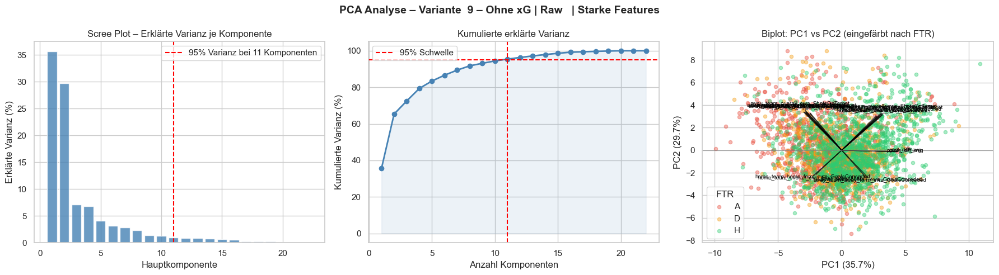

  → 11 Komponenten erklären 95% der Varianz (von 22 ursprünglichen Features)



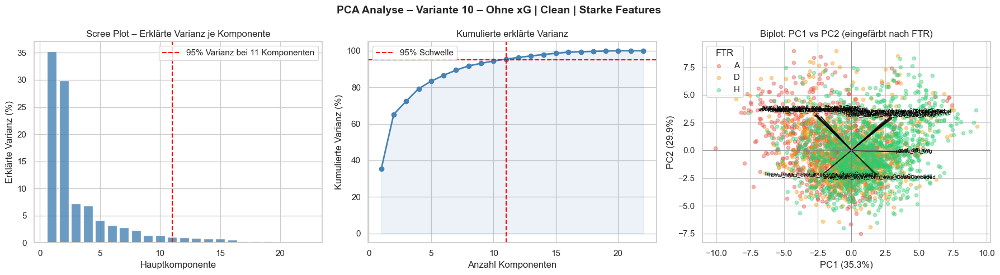

  → 11 Komponenten erklären 95% der Varianz (von 22 ursprünglichen Features)



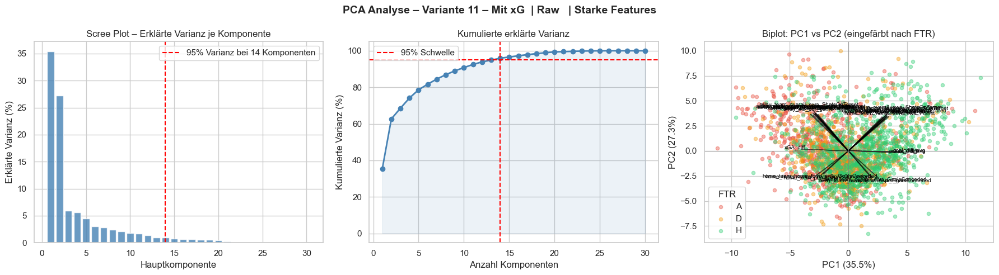

  → 14 Komponenten erklären 95% der Varianz (von 30 ursprünglichen Features)



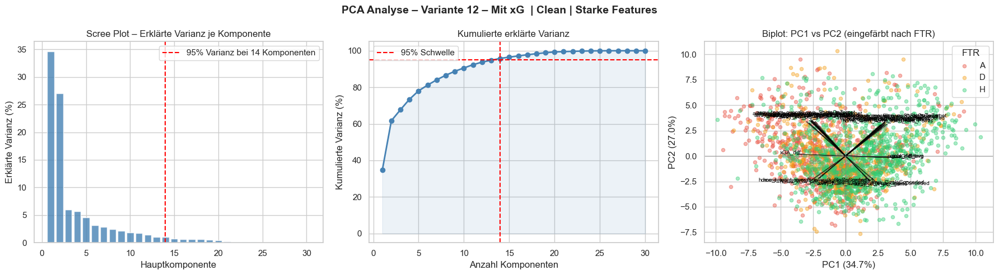

  → 14 Komponenten erklären 95% der Varianz (von 30 ursprünglichen Features)



In [9]:
# ── 3.1 PCA Visualisierung ────────────────────────────────────────────────────

def plot_pca_analysis(df, features, title, variance=0.95):
    """
    Zeigt 3 Grafiken für eine PCA:
    1. Scree Plot – erklärte Varianz je Komponente
    2. Kumulierte erklärte Varianz
    3. Biplot (PC1 vs PC2) – Datenpunkte eingefärbt nach FTR
    """
    scaler_pca = StandardScaler()
    X_scaled = scaler_pca.fit_transform(df[features])

    # Volle PCA (alle Komponenten) für Scree + Kumuliert
    pca_full = PCA(random_state=42)
    pca_full.fit(X_scaled)
    explained = pca_full.explained_variance_ratio_
    cumulative = np.cumsum(explained)
    n_components_95 = np.argmax(cumulative >= variance) + 1

    # PCA auf 2 Komponenten für Biplot
    pca_2d = PCA(n_components=2, random_state=42)
    X_2d = pca_2d.fit_transform(X_scaled)

    palette = {'H': '#2ecc71', 'D': '#f39c12', 'A': '#e74c3c'}

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle(f"PCA Analyse – {title}", fontsize=14, fontweight='bold')

    # ── Grafik 1: Scree Plot ──────────────────────────────────────────────────
    axes[0].bar(range(1, len(explained) + 1), explained * 100,
                color='steelblue', alpha=0.8)
    axes[0].axvline(n_components_95, color='red', linestyle='--',
                    label=f'{int(variance*100)}% Varianz bei {n_components_95} Komponenten')
    axes[0].set_title("Scree Plot – Erklärte Varianz je Komponente")
    axes[0].set_xlabel("Hauptkomponente")
    axes[0].set_ylabel("Erklärte Varianz (%)")
    axes[0].legend()

    # ── Grafik 2: Kumulierte Varianz ──────────────────────────────────────────
    axes[1].plot(range(1, len(cumulative) + 1), cumulative * 100,
                 marker='o', color='steelblue', linewidth=2)
    axes[1].axhline(variance * 100, color='red', linestyle='--',
                    label=f'{int(variance*100)}% Schwelle')
    axes[1].axvline(n_components_95, color='red', linestyle='--')
    axes[1].fill_between(range(1, len(cumulative) + 1),
                         cumulative * 100, alpha=0.1, color='steelblue')
    axes[1].set_title("Kumulierte erklärte Varianz")
    axes[1].set_xlabel("Anzahl Komponenten")
    axes[1].set_ylabel("Kumulierte Varianz (%)")
    axes[1].legend()

    # ── Grafik 3: Biplot (PC1 vs PC2) ────────────────────────────────────────
    df_2d = pd.DataFrame(X_2d, columns=['PC1', 'PC2'])
    df_2d['FTR'] = df['FTR'].values

    for klasse, group in df_2d.groupby('FTR'):
        axes[2].scatter(group['PC1'], group['PC2'],
                        color=palette[klasse], label=klasse,
                        alpha=0.4, s=20)

    # Loadings einzeichnen (Original-Features als Pfeile)
    loadings = pca_2d.components_.T
    scale = np.max(np.abs(X_2d)) / np.max(np.abs(loadings)) * 0.4
    for i, feat in enumerate(features):
        axes[2].arrow(0, 0,
                      loadings[i, 0] * scale,
                      loadings[i, 1] * scale,
                      color='black', alpha=0.6,
                      head_width=0.05, head_length=0.05)
        axes[2].text(loadings[i, 0] * scale * 1.15,
                     loadings[i, 1] * scale * 1.15,
                     feat, fontsize=7, ha='center', color='black')

    axes[2].set_title("Biplot: PC1 vs PC2 (eingefärbt nach FTR)")
    axes[2].set_xlabel(f"PC1 ({pca_2d.explained_variance_ratio_[0]*100:.1f}%)")
    axes[2].set_ylabel(f"PC2 ({pca_2d.explained_variance_ratio_[1]*100:.1f}%)")
    axes[2].legend(title='FTR')
    axes[2].axhline(0, color='grey', linewidth=0.5)
    axes[2].axvline(0, color='grey', linewidth=0.5)

    plt.tight_layout()
    plt.show()
    print(f"  → {n_components_95} Komponenten erklären {variance*100:.0f}% der Varianz "
          f"(von {len(features)} ursprünglichen Features)\n")


# ── Alle 4 PCA-Varianten plotten ──────────────────────────────────────────────
plot_pca_analysis(df_base_raw,   strong_base, "Variante  9 – Ohne xG | Raw   | Starke Features")
plot_pca_analysis(df_base_clean, strong_base, "Variante 10 – Ohne xG | Clean | Starke Features")
plot_pca_analysis(df_xg_raw,     strong_xg,   "Variante 11 – Mit xG  | Raw   | Starke Features")
plot_pca_analysis(df_xg_clean,   strong_xg,   "Variante 12 – Mit xG  | Clean | Starke Features")

## 4. Model Training & Hyperparameter Tuning

Für jede der 12 Varianten trainieren wir **XGBoost** und ein **Neuronales Netz (MLP)**.

**Besonderheit – Bundesliga-spezifisch:**
- Draws (D) sind stark unterrepräsentiert → wir nutzen `class_weight` / `scale_pos_weight`
- Hauptmetrik ist **F1 (macro)** und speziell **F1 für Klasse D** — nicht Accuracy
- Kreuzvalidierung mit `StratifiedKFold` (5 Folds) stellt sicher, dass alle Klassen in jedem Fold vertreten sind

### Hilfsfunktionen:

In [10]:
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.utils.class_weight import compute_sample_weight
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score
from sklearn.pipeline import Pipeline
import lightgbm as lgb

# ── Gemeinsame Einstellungen ───────────────────────────────────────────────────
CV_SPLITS   = 5
TEST_SIZE   = 0.2
RANDOM_SEED = 42
cv      = StratifiedKFold(n_splits=CV_SPLITS, shuffle=True, random_state=RANDOM_SEED)
SCORING = 'f1_macro'

def compute_metrics(y_test, y_pred, classes):
    classes = list(classes)
    return {
        'acc':        accuracy_score(y_test, y_pred),
        'f1_macro':   f1_score(y_test, y_pred, average='macro'),
        'f1_per':     f1_score(y_test, y_pred, average=None),
        'prec_macro': precision_score(y_test, y_pred, average='macro'),
        'prec_per':   precision_score(y_test, y_pred, average=None),
        'rec_macro':  recall_score(y_test, y_pred, average='macro'),
        'rec_per':    recall_score(y_test, y_pred, average=None),
        'f1_draw':    f1_score(y_test, y_pred, average=None)[classes.index('D')]
                      if 'D' in classes else 0.0,
    }

# ── 1. Logistische Regression (Baseline) ──────────────────────────────────────
def tune_logreg(X_train, X_test, y_train, y_test):
    param_dist = {
        'C':        [0.01, 0.1, 1.0, 10.0, 100.0],
        'solver':   ['lbfgs', 'saga'],
        'max_iter': [500, 1000],
    }
    model  = LogisticRegression(class_weight='balanced', random_state=RANDOM_SEED)
    search = RandomizedSearchCV(model, param_distributions=param_dist,
                                n_iter=10, cv=cv, scoring=SCORING,
                                random_state=RANDOM_SEED, n_jobs=-1, verbose=0)
    search.fit(X_train, y_train)
    y_pred  = search.best_estimator_.predict(X_test)
    metrics = compute_metrics(y_test, y_pred, le.classes_)
    return {
        'model':       search.best_estimator_,
        'cv_f1':       search.best_score_,
        'metrics':     metrics,
        'best_params': search.best_params_,
        'y_pred':      y_pred,
        'cv_scores':   search.cv_results_['mean_test_score'],
    }

# ── 2. Random Forest ───────────────────────────────────────────────────────────
def tune_randomforest(X_train, X_test, y_train, y_test):
    param_dist = {
        'n_estimators':      [100, 200, 300, 400],
        'max_depth':         [None, 5, 10, 15],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf':  [1, 2, 4],
        'max_features':      ['sqrt', 'log2'],
    }
    model  = RandomForestClassifier(class_weight='balanced',
                                    random_state=RANDOM_SEED, n_jobs=-1)
    search = RandomizedSearchCV(model, param_distributions=param_dist,
                                n_iter=20, cv=cv, scoring=SCORING,
                                random_state=RANDOM_SEED, n_jobs=-1, verbose=0)
    search.fit(X_train, y_train)
    y_pred  = search.best_estimator_.predict(X_test)
    metrics = compute_metrics(y_test, y_pred, le.classes_)
    return {
        'model':       search.best_estimator_,
        'cv_f1':       search.best_score_,
        'metrics':     metrics,
        'best_params': search.best_params_,
        'y_pred':      y_pred,
        'cv_scores':   search.cv_results_['mean_test_score'],
    }

# ── 3. LightGBM ────────────────────────────────────────────────────────────────
def tune_lightgbm(X_train, X_test, y_train, y_test):
    sample_weights = compute_sample_weight(class_weight='balanced', y=y_train)
    param_dist = {
        'n_estimators':     [100, 200, 300, 400],
        'max_depth':        [3, 4, 5, 6, -1],
        'learning_rate':    [0.01, 0.05, 0.1, 0.15],
        'subsample':        [0.7, 0.8, 0.9, 1.0],
        'colsample_bytree': [0.7, 0.8, 0.9, 1.0],
        'num_leaves':       [15, 31, 63],
        'reg_alpha':        [0, 0.1, 0.5],
    }
    model  = lgb.LGBMClassifier(random_state=RANDOM_SEED, n_jobs=-1, verbose=-1)
    search = RandomizedSearchCV(model, param_distributions=param_dist,
                                n_iter=20, cv=cv, scoring=SCORING,
                                random_state=RANDOM_SEED, n_jobs=-1, verbose=0)
    search.fit(X_train, y_train, sample_weight=sample_weights)
    y_pred  = search.best_estimator_.predict(X_test)
    metrics = compute_metrics(y_test, y_pred, le.classes_)
    return {
        'model':       search.best_estimator_,
        'cv_f1':       search.best_score_,
        'metrics':     metrics,
        'best_params': search.best_params_,
        'y_pred':      y_pred,
        'cv_scores':   search.cv_results_['mean_test_score'],
    }

# ── 4. XGBoost ─────────────────────────────────────────────────────────────────
def tune_xgboost(X_train, X_test, y_train, y_test):
    sample_weights = compute_sample_weight(class_weight='balanced', y=y_train)
    param_dist = {
        'n_estimators':     [100, 200, 300, 400],
        'max_depth':        [3, 4, 5, 6],
        'learning_rate':    [0.01, 0.05, 0.1, 0.15],
        'subsample':        [0.7, 0.8, 0.9, 1.0],
        'colsample_bytree': [0.7, 0.8, 0.9, 1.0],
        'min_child_weight': [1, 3, 5],
        'gamma':            [0, 0.1, 0.2],
    }
    model  = XGBClassifier(eval_metric='mlogloss',
                           random_state=RANDOM_SEED, n_jobs=-1)
    search = RandomizedSearchCV(model, param_distributions=param_dist,
                                n_iter=20, cv=cv, scoring=SCORING,
                                random_state=RANDOM_SEED, n_jobs=-1, verbose=0)
    search.fit(X_train, y_train, sample_weight=sample_weights)
    y_pred  = search.best_estimator_.predict(X_test)
    metrics = compute_metrics(y_test, y_pred, le.classes_)
    return {
        'model':       search.best_estimator_,
        'cv_f1':       search.best_score_,
        'metrics':     metrics,
        'best_params': search.best_params_,
        'y_pred':      y_pred,
        'cv_scores':   search.cv_results_['mean_test_score'],
    }

# ── 5. MLP ─────────────────────────────────────────────────────────────────────
def tune_mlp(X_train, X_test, y_train, y_test):
    from collections import Counter
    # Oversampling da MLPClassifier kein sample_weight unterstützt
    X_train_df   = pd.DataFrame(X_train)
    y_train_s    = pd.Series(y_train)
    class_counts = Counter(y_train)
    max_count    = max(class_counts.values())
    X_resampled  = [X_train_df]
    y_resampled  = [y_train_s]
    for cls, count in class_counts.items():
        if count < max_count:
            deficit   = max_count - count
            idx       = y_train_s[y_train_s == cls].index
            extra_idx = np.random.choice(idx, size=deficit, replace=True)
            X_resampled.append(X_train_df.loc[extra_idx])
            y_resampled.append(y_train_s.loc[extra_idx])
    X_bal = pd.concat(X_resampled).values
    y_bal = pd.concat(y_resampled).values

    param_dist = {
        'hidden_layer_sizes': [(64,), (128,), (64, 32), (128, 64),
                               (128, 64, 32), (256, 128, 64)],
        'activation':         ['relu', 'tanh'],
        'alpha':              [0.0001, 0.001, 0.01],
        'learning_rate_init': [0.001, 0.005, 0.01],
        'max_iter':           [300, 500],
    }
    model  = MLPClassifier(random_state=RANDOM_SEED, early_stopping=True,
                           validation_fraction=0.1)
    search = RandomizedSearchCV(model, param_distributions=param_dist,
                                n_iter=20, cv=cv, scoring=SCORING,
                                random_state=RANDOM_SEED, n_jobs=-1, verbose=0)
    search.fit(X_bal, y_bal)
    y_pred  = search.best_estimator_.predict(X_test)
    metrics = compute_metrics(y_test, y_pred, le.classes_)
    return {
        'model':       search.best_estimator_,
        'cv_f1':       search.best_score_,
        'metrics':     metrics,
        'best_params': search.best_params_,
        'y_pred':      y_pred,
        'cv_scores':   search.cv_results_['mean_test_score'],
    }

# ── Gemeinsamer Wrapper ────────────────────────────────────────────────────────
def run_variant(df_var, features):
    X = df_var[features].values
    y = df_var['Target'].values
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=TEST_SIZE, random_state=RANDOM_SEED, stratify=y)
    scaler  = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test  = scaler.transform(X_test)
    logreg_res = tune_logreg(X_train, X_test, y_train, y_test)
    rf_res     = tune_randomforest(X_train, X_test, y_train, y_test)
    lgbm_res   = tune_lightgbm(X_train, X_test, y_train, y_test)
    xgb_res    = tune_xgboost(X_train, X_test, y_train, y_test)
    mlp_res    = tune_mlp(X_train, X_test, y_train, y_test)
    return logreg_res, rf_res, lgbm_res, xgb_res, mlp_res, scaler, X_test, y_test

print("Hilfsfunktionen geladen ✔")
print("Modelle: Logistische Regression | Random Forest | LightGBM | XGBoost | MLP")

Hilfsfunktionen geladen ✔
Modelle: Logistische Regression | Random Forest | LightGBM | XGBoost | MLP


### Training aller 12 Varianten:

In [11]:
results      = []
best_per_model = {
    'LogReg':   {'metrics': {'f1_macro': 0}},
    'RF':       {'metrics': {'f1_macro': 0}},
    'LGBM':     {'metrics': {'f1_macro': 0}},
    'XGBoost':  {'metrics': {'f1_macro': 0}},
    'MLP':      {'metrics': {'f1_macro': 0}},
}
best_overall = {'metrics': {'f1_macro': 0}}

MODEL_NAMES = ['LogReg', 'RF', 'LGBM', 'XGBoost', 'MLP']

print(f"Starte Training – {len(variants)} Varianten × 5 Modelle ...")
print(f"Hauptmetrik: F1 macro | Draw-F1 separat ausgewiesen\n")
print(f"{'Variante':<45} {'Bestes Modell':<15} {'F1 macro':>10}")
print("─" * 90)

for variant_name, (df_var, features) in variants.items():
    logreg_res, rf_res, lgbm_res, xgb_res, mlp_res, scaler, X_test, y_test = \
        run_variant(df_var, features)

    all_res = [logreg_res, rf_res, lgbm_res, xgb_res, mlp_res]

    best_f1 = -1
    best_name = ""
    for name, r in zip(MODEL_NAMES, all_res):
        if r['metrics']['f1_macro'] > best_f1:
            best_f1 = r['metrics']['f1_macro']
            best_name = name
    print(f"{variant_name:<45} {best_name:<15} {best_f1:>10.4f}")

    row = {'Variante': variant_name, 'Datenpunkte': len(df_var),
           '# Features': len(features)}
    for name, res in zip(MODEL_NAMES, all_res):
        row[f'{name} F1']      = res['metrics']['f1_macro']
        row[f'{name} F1-Draw'] = res['metrics']['f1_draw']
        row[f'{name} Acc']     = res['metrics']['acc']
        row[f'{name} CV F1']   = res['cv_f1']
    results.append(row)

    # Bestes Modell je Typ tracken
    for name, res in zip(MODEL_NAMES, all_res):
        if res['metrics']['f1_macro'] > best_per_model[name]['metrics']['f1_macro']:
            best_per_model[name] = {**res, 'name': variant_name,
                                    'scaler': scaler, 'X_test': X_test,
                                    'y_test': y_test}

    # Bestes Modell overall
    for name, res in zip(MODEL_NAMES, all_res):
        if res['metrics']['f1_macro'] > best_overall['metrics']['f1_macro']:
            best_overall = {**res, 'name': variant_name, 'type': name,
                            'scaler': scaler, 'X_test': X_test, 'y_test': y_test}

print("─" * 90)
results_df = pd.DataFrame(results).sort_values('XGBoost F1', ascending=False)

best_per_variant = []
for row in results:
    f1_scores = {name: row[f'{name} F1'] for name in MODEL_NAMES}
    best_name = max(f1_scores, key=f1_scores.get)
    best_per_variant.append({
        'Variante': row['Variante'],
        'Bestes Modell': best_name,
        'F1 macro': f1_scores[best_name],
        'F1-Draw': row[f'{best_name} F1-Draw'],
        'Accuracy': row[f'{best_name} Acc'],
        'CV F1': row[f'{best_name} CV F1']
    })
best_variant_df = pd.DataFrame(best_per_variant).sort_values('F1 macro', ascending=False)
display(best_variant_df)

Starte Training – 12 Varianten × 5 Modelle ...
Hauptmetrik: F1 macro | Draw-F1 separat ausgewiesen

Variante                                      Bestes Modell     F1 macro
──────────────────────────────────────────────────────────────────────────────────────────


/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: U

 1. Ohne xG | Raw   | Alle Features           RF                  0.4383


/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: U

 2. Ohne xG | Raw   | Starke Features         RF                  0.4386


/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: U

 3. Ohne xG | Clean | Alle Features           LogReg              0.4423


/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: U

 4. Ohne xG | Clean | Starke Features         LogReg              0.4485


/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: U

 5. Mit xG  | Raw   | Alle Features           LogReg              0.4715


/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: U

 6. Mit xG  | Raw   | Starke Features         RF                  0.4875


/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: U

 7. Mit xG  | Clean | Alle Features           RF                  0.4824


/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: U

 8. Mit xG  | Clean | Starke Features         RF                  0.4794


/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: U

 9. Ohne xG | Raw   | PCA (Basis V2)          XGBoost             0.4385


/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: U

10. Ohne xG | Clean | PCA (Basis V4)          XGBoost             0.4568


/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: U

11. Mit xG  | Raw   | PCA (Basis V6)          RF                  0.4551


/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/tom/Antigravity/Bachelor Arbeit/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: U

12. Mit xG  | Clean | PCA (Basis V8)          LogReg              0.4544
──────────────────────────────────────────────────────────────────────────────────────────


,Variante,Bestes Modell,F1 macro,F1-Draw,Accuracy,CV F1
5,6. Mit xG | Raw | Starke Features,RF,0.487466,0.348936,0.509761,0.444413
6,7. Mit xG | Clean | Alle Features,RF,0.482404,0.344828,0.502212,0.437151
7,8. Mit xG | Clean | Starke Features,RF,0.479427,0.327586,0.500000,0.434437
4,5. Mit xG | Raw | Alle Features,LogReg,0.471472,0.312236,0.496746,0.444264
9,10. Ohne xG | Clean | PCA (Basis V4),XGBoost,0.456820,0.286738,0.485618,0.445959
10,11. Mit xG | Raw | PCA (Basis V6),RF,0.455074,0.299145,0.479393,0.435805
11,12. Mit xG | Clean | PCA (Basis V8),LogReg,0.454406,0.258373,0.486726,0.449234
3,4. Ohne xG | Clean | Starke Features,LogReg,0.448485,0.273381,0.478849,0.444109
2,3. Ohne xG | Clean | Alle Features,LogReg,0.442291,0.280822,0.467005,0.444356
1,2. Ohne xG | Raw | Starke Features,RF,0.438586,0.292398,0.450586,0.452609


### Ergebnisse visualisieren:

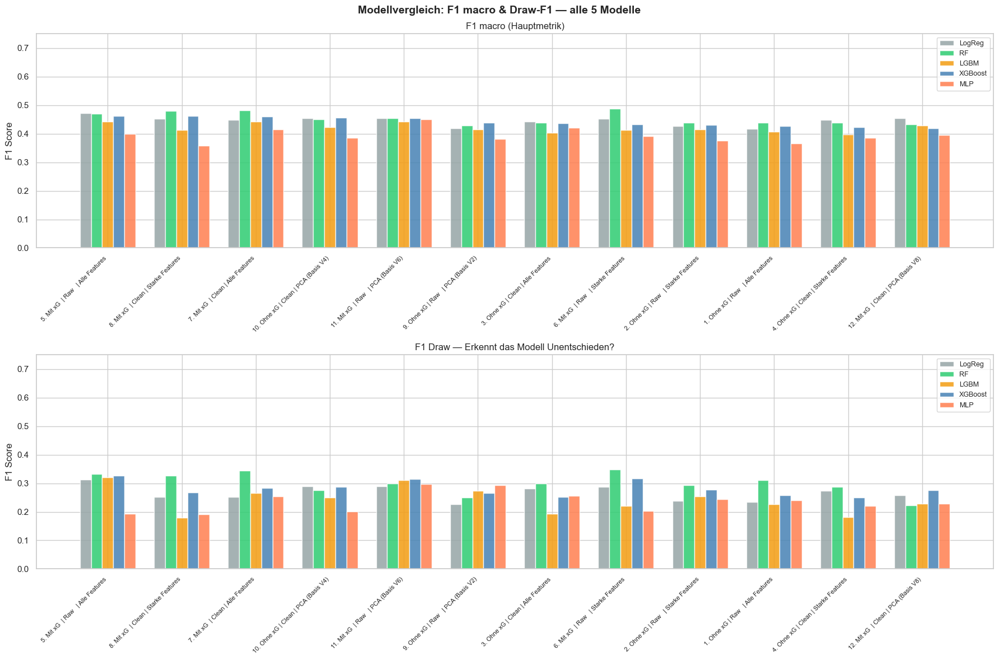

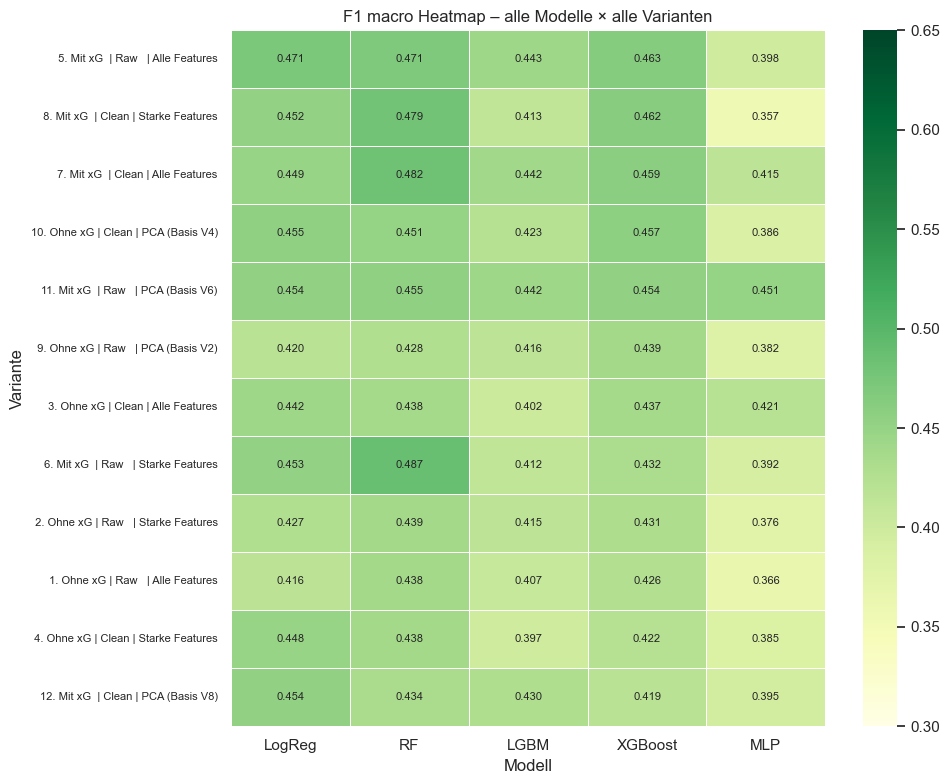

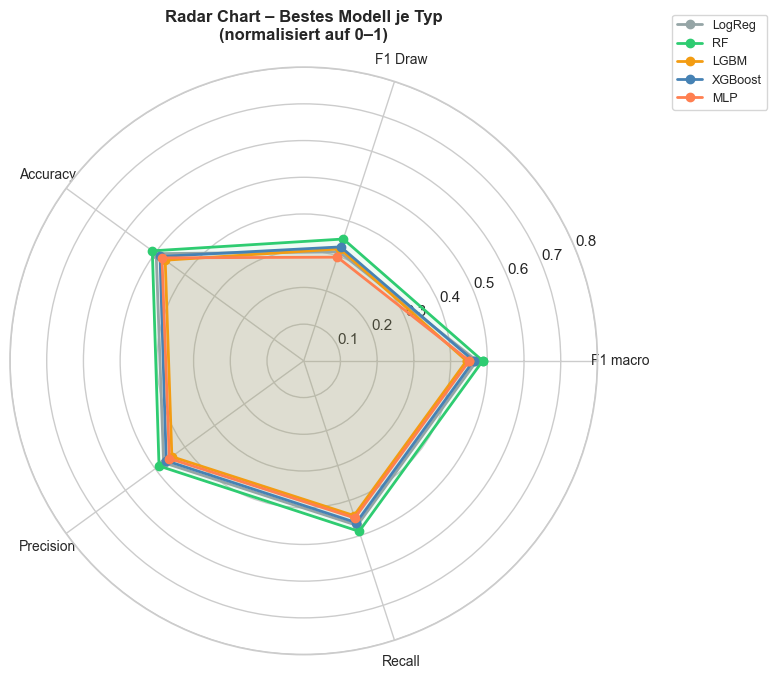


══════════════════════════════════════════════════════════════════════
  BESTE MODELLE JE TYP (nach F1 macro)
══════════════════════════════════════════════════════════════════════
Modell         F1 macro   F1 Draw   Accuracy  Variante
──────────────────────────────────────────────────────────────────────
LogReg           0.4715    0.3122     0.4967   5. Mit xG  | Raw   | Alle Features
RF               0.4875    0.3489     0.5098   6. Mit xG  | Raw   | Starke Features
LGBM             0.4434    0.3207     0.4664   5. Mit xG  | Raw   | Alle Features
XGBoost          0.4628    0.3264     0.4837   5. Mit xG  | Raw   | Alle Features
MLP              0.4509    0.2969     0.4772  11. Mit xG  | Raw   | PCA (Basis V6)
──────────────────────────────────────────────────────────────────────

🥇 Overall Gewinner: RF →  6. Mit xG  | Raw   | Starke Features
   F1 macro: 0.4875 | F1 Draw: 0.3489
══════════════════════════════════════════════════════════════════════


In [12]:
# ── 4.1 F1 macro aller Modelle je Variante ────────────────────────────────────
colors = {'LogReg': '#95a5a6', 'RF': '#2ecc71',
          'LGBM': '#f39c12', 'XGBoost': 'steelblue', 'MLP': 'coral'}

fig, axes = plt.subplots(2, 1, figsize=(18, 12))
fig.suptitle("Modellvergleich: F1 macro & Draw-F1 — alle 5 Modelle",
             fontsize=14, fontweight='bold')

x     = np.arange(len(results_df))
width = 0.15

for i, (name, color) in enumerate(colors.items()):
    offset = (i - 2) * width
    axes[0].bar(x + offset, results_df[f'{name} F1'], width,
                label=name, color=color, alpha=0.85)
    axes[1].bar(x + offset, results_df[f'{name} F1-Draw'], width,
                label=name, color=color, alpha=0.85)

for ax, title in zip(axes, ['F1 macro (Hauptmetrik)', 'F1 Draw — Erkennt das Modell Unentschieden?']):
    ax.set_xticks(x)
    ax.set_xticklabels(results_df['Variante'], rotation=45, ha='right', fontsize=8)
    ax.set_ylabel('F1 Score')
    ax.set_title(title)
    ax.set_ylim(0, 0.75)
    ax.legend(fontsize=9)
    ax.axhline(0, color='black', linewidth=0.5)

plt.tight_layout()
plt.show()

# ── 4.2 Heatmap: F1 macro aller Modelle × Varianten ──────────────────────────
heat_data = results_df.set_index('Variante')[
    [f'{n} F1' for n in MODEL_NAMES]
].rename(columns={f'{n} F1': n for n in MODEL_NAMES})

fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(heat_data, annot=True, fmt='.3f', cmap='YlGn',
            linewidths=0.5, vmin=0.3, vmax=0.65,
            annot_kws={'size': 8}, ax=ax)
ax.set_title("F1 macro Heatmap – alle Modelle × alle Varianten")
ax.set_xlabel("Modell")
ax.tick_params(axis='y', labelsize=8)
plt.tight_layout()
plt.show()

# ── 4.3 Radar Chart: Bestes Modell je Typ im Vergleich ───────────────────────
from matplotlib.patches import FancyArrowPatch
metrics_labels = ['F1 macro', 'F1 Draw', 'Accuracy', 'Precision', 'Recall']
angles = np.linspace(0, 2 * np.pi, len(metrics_labels), endpoint=False).tolist()
angles += angles[:1]

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
ax.set_title("Radar Chart – Bestes Modell je Typ\n(normalisiert auf 0–1)",
             fontsize=12, fontweight='bold', pad=20)

for name, color in colors.items():
    m = best_per_model[name]['metrics']
    values = [m['f1_macro'], m['f1_draw'], m['acc'], m['prec_macro'], m['rec_macro']]
    values += values[:1]
    ax.plot(angles, values, 'o-', linewidth=2, label=name, color=color)
    ax.fill(angles, values, alpha=0.07, color=color)

ax.set_xticks(angles[:-1])
ax.set_xticklabels(metrics_labels, fontsize=10)
ax.set_ylim(0, 0.8)
ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1), fontsize=9)
plt.tight_layout()
plt.show()

# ── 4.4 Zusammenfassung ───────────────────────────────────────────────────────
print("\n" + "═"*70)
print("  BESTE MODELLE JE TYP (nach F1 macro)")
print("═"*70)
print(f"{'Modell':<12} {'F1 macro':>10} {'F1 Draw':>9} {'Accuracy':>10}  Variante")
print("─"*70)
for name in MODEL_NAMES:
    m = best_per_model[name]['metrics']
    print(f"{name:<12} {m['f1_macro']:>10.4f} {m['f1_draw']:>9.4f} "
          f"{m['acc']:>10.4f}  {best_per_model[name]['name']}")
print("─"*70)
print(f"\n🥇 Overall Gewinner: {best_overall['type']} → {best_overall['name']}")
print(f"   F1 macro: {best_overall['metrics']['f1_macro']:.4f} | "
      f"F1 Draw: {best_overall['metrics']['f1_draw']:.4f}")
print("═"*70)

## 5. Finale Auswertung des besten Modells

Wir werten das beste Modell (XGBoost & MLP) detailliert aus:
- **Metriken**: Accuracy, F1, Precision, Recall (macro & pro Klasse)
- **Confusion Matrix**: Absolut & Normalisiert
- **Classification Report**: Pro Klasse
- **Feature Importance** (XGBoost) / **Gewichte** (MLP)
- **CV-Fold Stabilität**: Accuracy je Fold
- **Kalibrierungskurve**: Wie gut sind die Wahrscheinlichkeiten?

In [13]:
from sklearn.metrics import (accuracy_score, f1_score, precision_score,
                             recall_score, classification_report,
                             confusion_matrix, ConfusionMatrixDisplay)
from sklearn.calibration import calibration_curve, CalibrationDisplay
import matplotlib.gridspec as gridspec

def full_evaluation(model_info, model_type, le, cv, title_suffix=""):
    """
    Vollständige Auswertung eines trainierten Modells.
    model_info: dict mit keys: model, X_test, y_test, name, cv_scores, best_params
    model_type: 'XGBoost' oder 'MLP'
    """
    model   = model_info['model']
    X_test  = model_info['X_test']
    y_test  = model_info['y_test']
    y_pred  = model.predict(X_test)
    classes = le.classes_   # ['A', 'D', 'H']

    # ── Metriken berechnen ────────────────────────────────────────────────────
    acc       = accuracy_score(y_test, y_pred)
    f1_macro  = f1_score(y_test, y_pred, average='macro')
    f1_per    = f1_score(y_test, y_pred, average=None)
    prec_macro= precision_score(y_test, y_pred, average='macro')
    prec_per  = precision_score(y_test, y_pred, average=None)
    rec_macro = recall_score(y_test, y_pred, average='macro')
    rec_per   = recall_score(y_test, y_pred, average=None)

    print("═"*65)
    print(f"  {model_type} – {model_info['name']} {title_suffix}")
    print("═"*65)
    print(f"  Accuracy  (gesamt):  {acc:.4f}")
    print(f"  F1        (macro):   {f1_macro:.4f}")
    print(f"  Precision (macro):   {prec_macro:.4f}")
    print(f"  Recall    (macro):   {rec_macro:.4f}")
    print("─"*65)
    print(f"  {'Klasse':<10} {'Precision':>10} {'Recall':>10} {'F1':>10}")
    print("─"*65)
    for i, cls in enumerate(classes):
        print(f"  {cls:<10} {prec_per[i]:>10.4f} {rec_per[i]:>10.4f} {f1_per[i]:>10.4f}")
    print("═"*65)
    print(f"\n  Beste Hyperparameter:\n  {model_info['best_params']}\n")

    # ══════════════════════════════════════════════════════════════════════════
    # GRAFIK-BLOCK 1: Confusion Matrices + Metriken pro Klasse
    # ══════════════════════════════════════════════════════════════════════════
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle(f"{model_type} – Confusion Matrix & Metriken | {model_info['name']}",
                 fontsize=13, fontweight='bold')

    # Absolute Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=classes, yticklabels=classes, ax=axes[0])
    axes[0].set_title("Confusion Matrix (absolut)")
    axes[0].set_xlabel("Predicted")
    axes[0].set_ylabel("Actual")

    # Normalisierte Confusion Matrix
    cm_norm = confusion_matrix(y_test, y_pred, normalize='true')
    sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Blues',
                xticklabels=classes, yticklabels=classes, ax=axes[1])
    axes[1].set_title("Confusion Matrix (normalisiert)")
    axes[1].set_xlabel("Predicted")
    axes[1].set_ylabel("Actual")

    # Metriken pro Klasse als Balkendiagramm
    x = np.arange(len(classes))
    width = 0.25
    axes[2].bar(x - width, prec_per,  width, label='Precision', color='steelblue', alpha=0.85)
    axes[2].bar(x,          rec_per,  width, label='Recall',    color='coral',     alpha=0.85)
    axes[2].bar(x + width,  f1_per,   width, label='F1',        color='seagreen',  alpha=0.85)
    axes[2].set_xticks(x)
    axes[2].set_xticklabels(classes)
    axes[2].set_ylim(0, 1.0)
    axes[2].set_title("Precision / Recall / F1 pro Klasse")
    axes[2].set_ylabel("Score")
    axes[2].legend()
    axes[2].axhline(f1_macro, color='black', linestyle='--',
                    linewidth=0.8, label=f'F1 Macro={f1_macro:.2f}')

    plt.tight_layout()
    plt.show()

    # ══════════════════════════════════════════════════════════════════════════
    # GRAFIK-BLOCK 2: CV-Fold Stabilität + Fehleranalyse
    # ══════════════════════════════════════════════════════════════════════════
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle(f"{model_type} – CV Stabilität & Fehleranalyse | {model_info['name']}",
                 fontsize=13, fontweight='bold')

    # CV-Fold Scores
    cv_scores = model_info['cv_scores']
    axes[0].plot(range(1, len(cv_scores) + 1), cv_scores,
                 marker='o', color='steelblue', linewidth=2)
    axes[0].axhline(np.mean(cv_scores), color='red', linestyle='--',
                    label=f'Mittelwert: {np.mean(cv_scores):.4f}')
    axes[0].fill_between(range(1, len(cv_scores) + 1),
                         np.mean(cv_scores) - np.std(cv_scores),
                         np.mean(cv_scores) + np.std(cv_scores),
                         alpha=0.15, color='steelblue', label=f'±1 Std: {np.std(cv_scores):.4f}')
    axes[0].set_title("CV Accuracy je Iteration (RandomizedSearch)")
    axes[0].set_xlabel("Iteration")
    axes[0].set_ylabel("CV Accuracy")
    axes[0].legend()

    # Fehleranalyse: Welche Klassen werden verwechselt?
    errors = pd.DataFrame({'Actual': le.inverse_transform(y_test),
                           'Predicted': le.inverse_transform(y_pred)})
    errors = errors[errors['Actual'] != errors['Predicted']]
    error_counts = errors.groupby(['Actual', 'Predicted']).size().reset_index(name='Anzahl')
    if len(error_counts) > 0:
        pivot = error_counts.pivot(index='Actual', columns='Predicted', values='Anzahl').fillna(0)
        sns.heatmap(pivot, annot=True, fmt='.0f', cmap='Reds',
                    linewidths=0.5, ax=axes[1])
        axes[1].set_title("Verwechslungs-Heatmap (nur Fehler)")
        axes[1].set_xlabel("Predicted (falsch)")
        axes[1].set_ylabel("Actual (richtig)")
    else:
        axes[1].text(0.5, 0.5, 'Keine Fehler!', ha='center', va='center', fontsize=14)
        axes[1].set_title("Verwechslungs-Heatmap")

    plt.tight_layout()
    plt.show()

    # ══════════════════════════════════════════════════════════════════════════
    # GRAFIK-BLOCK 3: Feature Importance (XGBoost) oder Gewichte (MLP)
    # ══════════════════════════════════════════════════════════════════════════
    # NEU — diesen Block ersetzen:
    if model_type in ('XGBoost', 'RF', 'LGBM'):
        if model_type == 'XGBoost':
            imps = model.feature_importances_
        elif model_type == 'RF':
            imps = model.feature_importances_
        elif model_type == 'LGBM':
            imps = model.feature_importances_

        importances = pd.Series(imps,
                                index=[f'F{i}' for i in range(len(imps))])
        importances = importances.sort_values(ascending=True)
        fig, ax = plt.subplots(figsize=(10, max(4, len(importances) * 0.35)))
        importances.plot(kind='barh', color=colors.get(model_type, 'steelblue'),
                        alpha=0.85, ax=ax)
        ax.set_title(f"{model_type} Feature Importance | {model_info['name']}")
        ax.set_xlabel("Importance Score")
        ax.axvline(importances.mean(), color='red', linestyle='--',
                label=f'Mittelwert: {importances.mean():.4f}')
        ax.legend()
        plt.tight_layout()
        plt.show()

    elif model_type == 'LogReg':
        # Koeffizienten der logistischen Regression
        coefs = pd.DataFrame(model.coef_,
                            columns=[f'F{i}' for i in range(model.coef_.shape[1])],
                            index=le.classes_)
        fig, ax = plt.subplots(figsize=(12, 4))
        sns.heatmap(coefs, cmap='coolwarm', center=0, annot=True,
                    fmt='.2f', linewidths=0.5, ax=ax,
                    annot_kws={'size': 7})
        ax.set_title(f"LogReg Koeffizienten je Klasse | {model_info['name']}")
        ax.set_xlabel("Features")
        ax.set_ylabel("Klasse")
        plt.tight_layout()
        plt.show()

    elif model_type == 'MLP':
        weights = model.coefs_[0]
        fig, ax = plt.subplots(figsize=(12, max(4, weights.shape[0] * 0.3)))
        sns.heatmap(weights, cmap='coolwarm', center=0,
                    yticklabels=[f'F{i}' for i in range(weights.shape[0])],
                    xticklabels=[f'N{i}' for i in range(weights.shape[1])],
                    ax=ax)
        ax.set_title(f"MLP Gewichte (Schicht 1) | {model_info['name']}")
        ax.set_xlabel("Neuronen (Layer 1)")
        ax.set_ylabel("Input Features")
        plt.tight_layout()
        plt.show()

    # ══════════════════════════════════════════════════════════════════════════
    # GRAFIK-BLOCK 4: Predicted Probability Distribution
    # ══════════════════════════════════════════════════════════════════════════
    if hasattr(model, 'predict_proba'):
        proba = model.predict_proba(X_test)
        fig, axes = plt.subplots(1, len(classes), figsize=(16, 4))
        fig.suptitle(f"{model_type} – Wahrscheinlichkeitsverteilung je Klasse | {model_info['name']}",
                     fontsize=12, fontweight='bold')
        palette = {'H': '#2ecc71', 'D': '#f39c12', 'A': '#e74c3c'}
        for i, cls in enumerate(classes):
            correct   = proba[y_test == i, i]
            incorrect = proba[y_test != i, i]
            axes[i].hist(correct,   bins=20, alpha=0.6, color=palette.get(cls, 'steelblue'),
                         label='Richtig klassifiziert')
            axes[i].hist(incorrect, bins=20, alpha=0.6, color='grey',
                         label='Falsch klassifiziert')
            axes[i].set_title(f"P(Klasse={cls})")
            axes[i].set_xlabel("Vorhergesagte Wahrscheinlichkeit")
            axes[i].set_ylabel("Häufigkeit")
            axes[i].legend(fontsize=8)
        plt.tight_layout()
        plt.show()

    return {
    'acc':       acc,
    'f1':        f1_macro,
    'f1_draw':   f1_per[list(le.classes_).index('D')] if 'D' in le.classes_ else 0.0,
    'precision': prec_macro,
    'recall':    rec_macro,
}

print("Auswertungs-Funktionen geladen ✔")

Auswertungs-Funktionen geladen ✔


### Auswertung ausführen:

Starte finale Auswertung aller 5 Modelle...


█████████████████████████████████████████████████████████████████
  LogReg
█████████████████████████████████████████████████████████████████
═════════════════════════════════════════════════════════════════
  LogReg –  5. Mit xG  | Raw   | Alle Features 
═════════════════════════════════════════════════════════════════
  Accuracy  (gesamt):  0.4967
  F1        (macro):   0.4715
  Precision (macro):   0.4718
  Recall    (macro):   0.4714
─────────────────────────────────────────────────────────────────
  Klasse      Precision     Recall         F1
─────────────────────────────────────────────────────────────────
  A              0.4965     0.5000     0.4982
  D              0.3058     0.3190     0.3122
  H              0.6131     0.5951     0.6040
═════════════════════════════════════════════════════════════════

  Beste Hyperparameter:
  {'solver': 'lbfgs', 'max_iter': 500, 'C': 0.01}



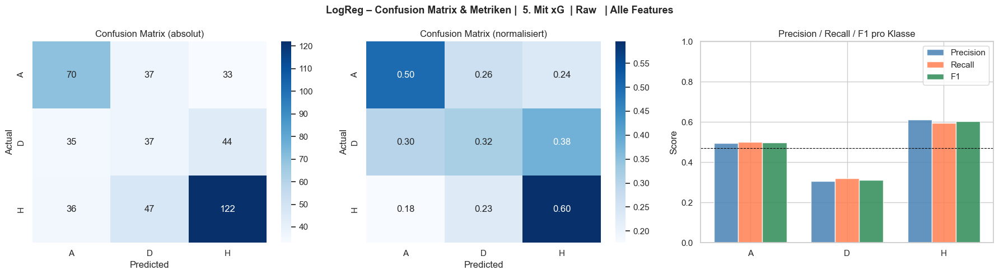

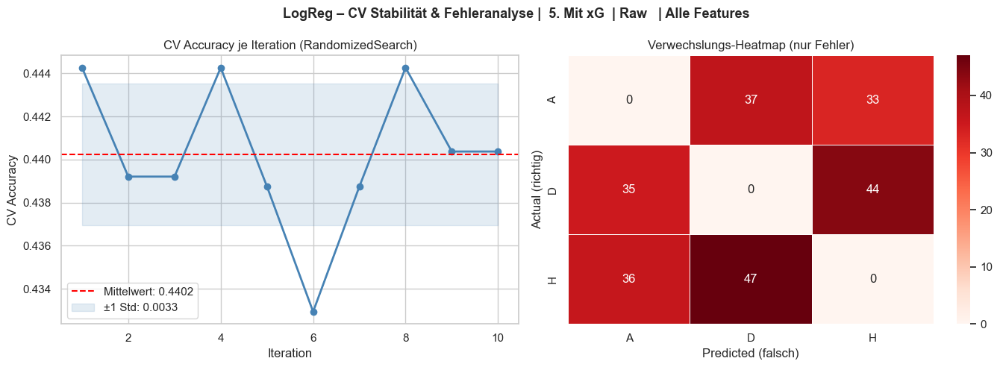

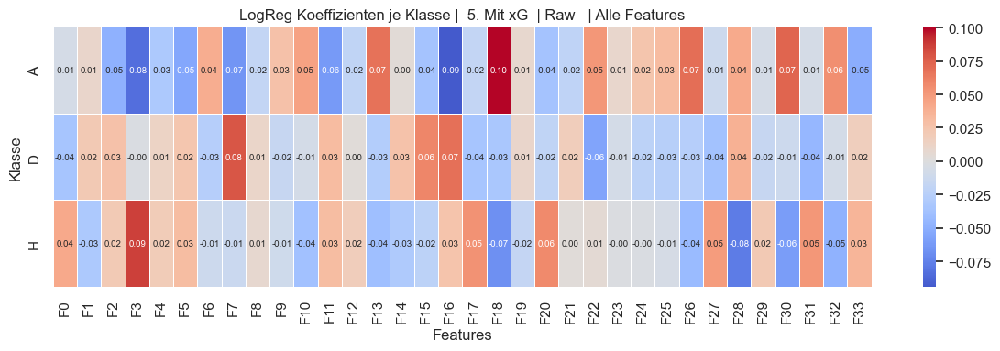

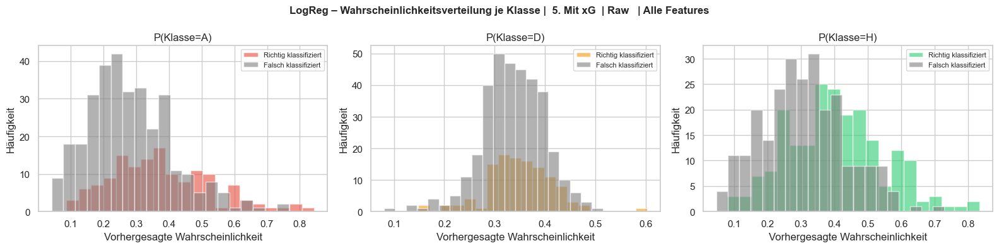


█████████████████████████████████████████████████████████████████
  RF
█████████████████████████████████████████████████████████████████
═════════════════════════════════════════════════════════════════
  RF –  6. Mit xG  | Raw   | Starke Features 
═════════════════════════════════════════════════════════════════
  Accuracy  (gesamt):  0.5098
  F1        (macro):   0.4875
  Precision (macro):   0.4872
  Recall    (macro):   0.4884
─────────────────────────────────────────────────────────────────
  Klasse      Precision     Recall         F1
─────────────────────────────────────────────────────────────────
  A              0.4932     0.5214     0.5069
  D              0.3445     0.3534     0.3489
  H              0.6237     0.5902     0.6065
═════════════════════════════════════════════════════════════════

  Beste Hyperparameter:
  {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 5}



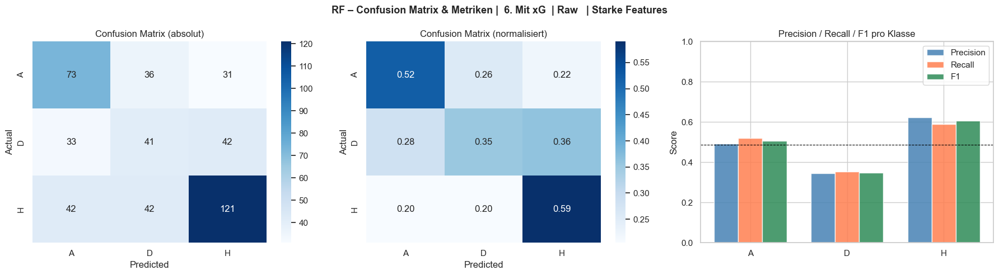

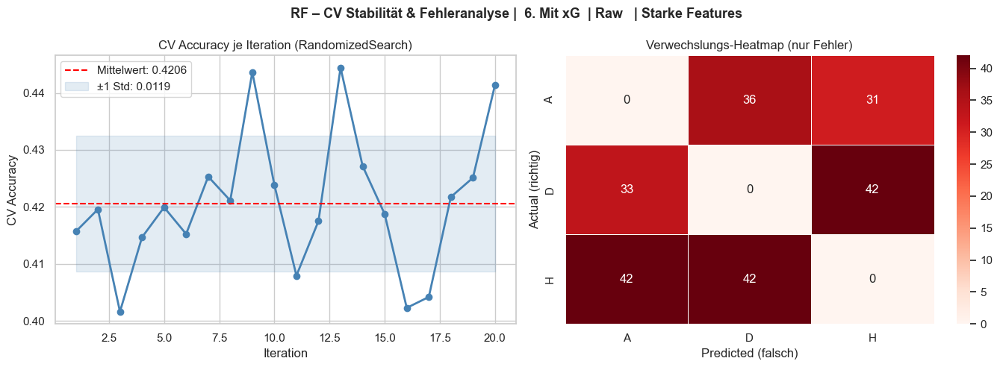

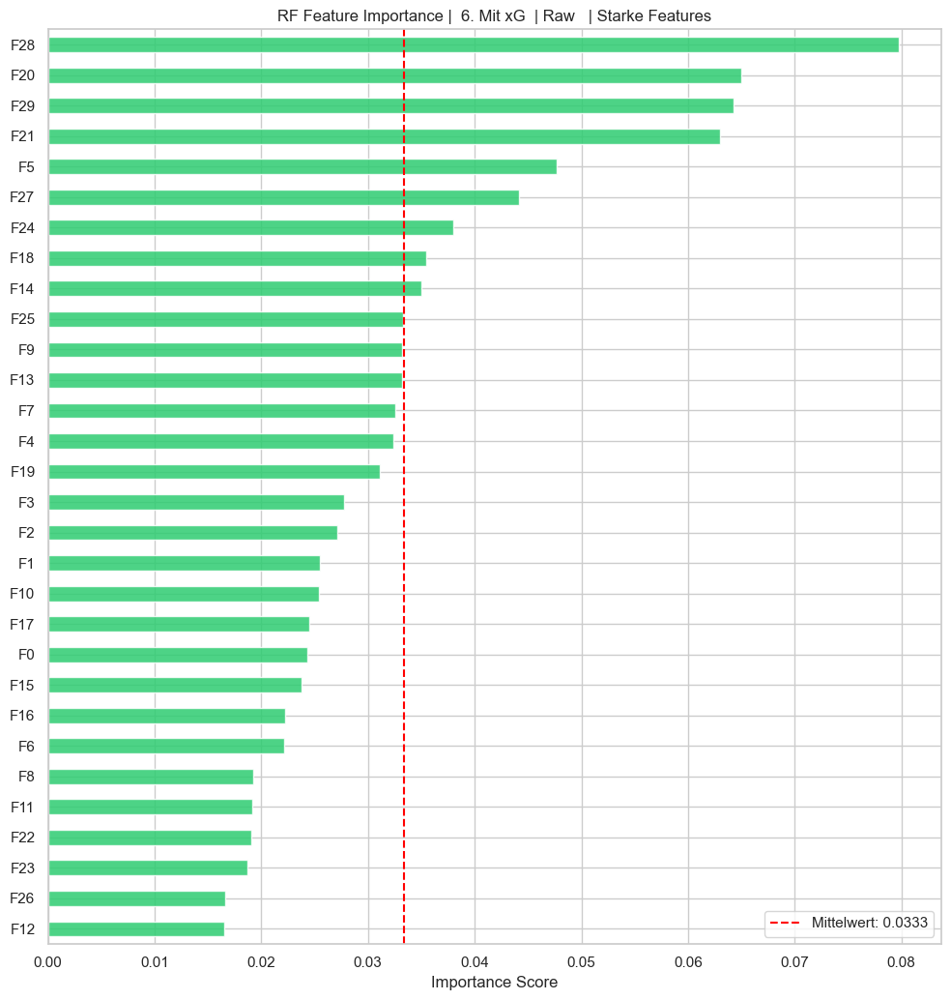

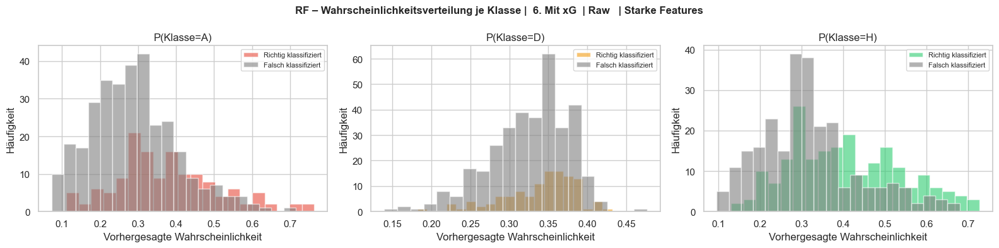


█████████████████████████████████████████████████████████████████
  LGBM
█████████████████████████████████████████████████████████████████
═════════════════════════════════════════════════════════════════
  LGBM –  5. Mit xG  | Raw   | Alle Features 
═════════════════════════════════════════════════════════════════
  Accuracy  (gesamt):  0.4664
  F1        (macro):   0.4434
  Precision (macro):   0.4439
  Recall    (macro):   0.4431
─────────────────────────────────────────────────────────────────
  Klasse      Precision     Recall         F1
─────────────────────────────────────────────────────────────────
  A              0.4519     0.4357     0.4436
  D              0.3140     0.3276     0.3207
  H              0.5659     0.5659     0.5659
═════════════════════════════════════════════════════════════════

  Beste Hyperparameter:
  {'subsample': 1.0, 'reg_alpha': 0.1, 'num_leaves': 15, 'n_estimators': 100, 'max_depth': 4, 'learning_rate': 0.15, 'colsample_bytree': 0.8}



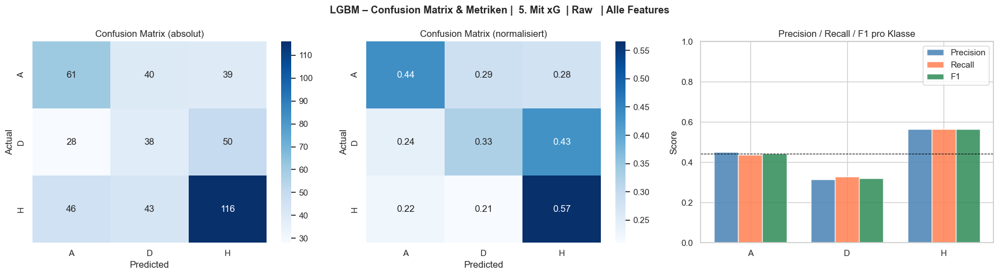

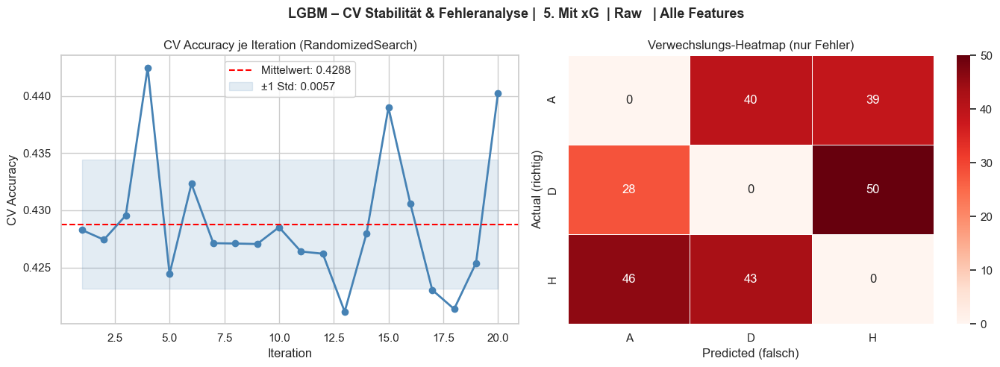

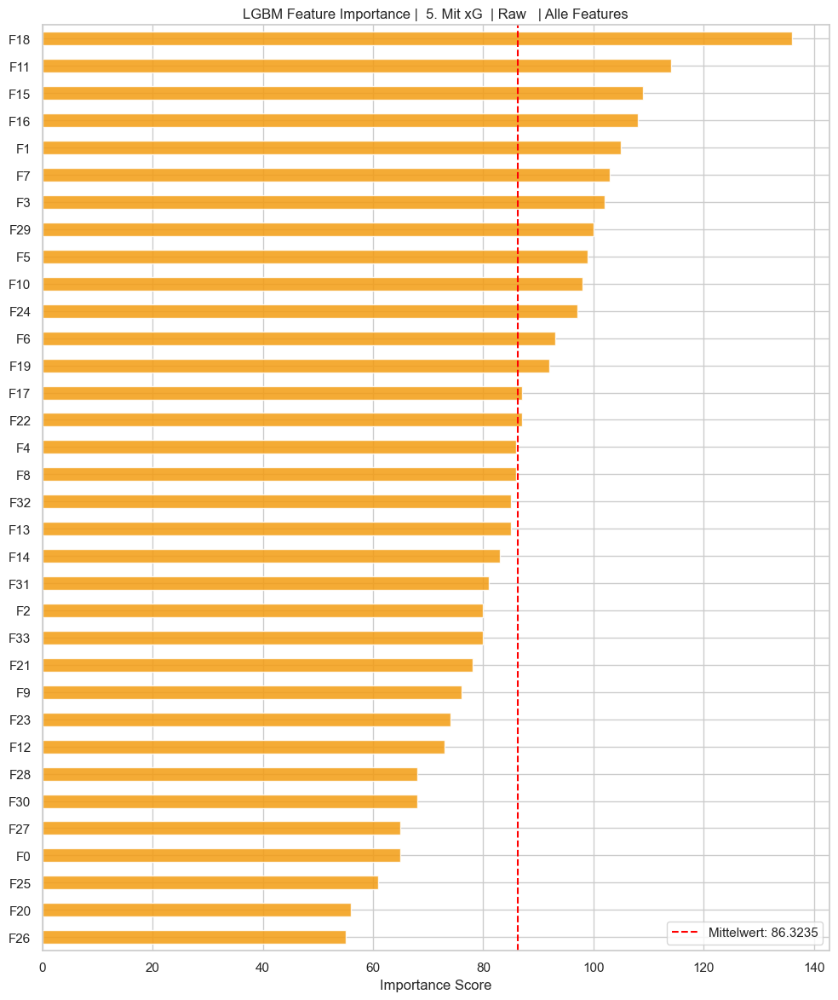

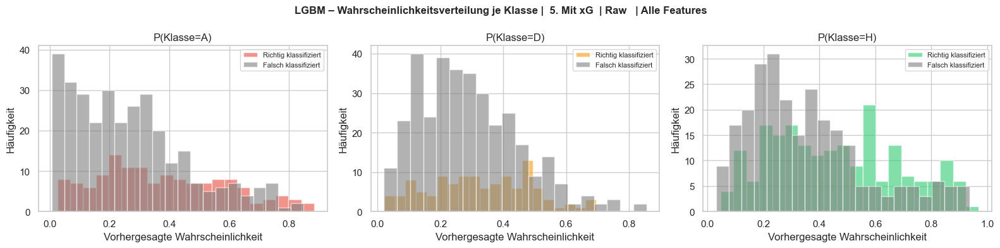


█████████████████████████████████████████████████████████████████
  XGBoost
█████████████████████████████████████████████████████████████████
═════════════════════════════════════════════════════════════════
  XGBoost –  5. Mit xG  | Raw   | Alle Features 
═════════════════════════════════════════════════════════════════
  Accuracy  (gesamt):  0.4837
  F1        (macro):   0.4628
  Precision (macro):   0.4629
  Recall    (macro):   0.4633
─────────────────────────────────────────────────────────────────
  Klasse      Precision     Recall         F1
─────────────────────────────────────────────────────────────────
  A              0.4759     0.4929     0.4842
  D              0.3171     0.3362     0.3264
  H              0.5959     0.5610     0.5779
═════════════════════════════════════════════════════════════════

  Beste Hyperparameter:
  {'subsample': 0.9, 'n_estimators': 300, 'min_child_weight': 1, 'max_depth': 3, 'learning_rate': 0.05, 'gamma': 0.1, 'colsample_bytree': 0.9}



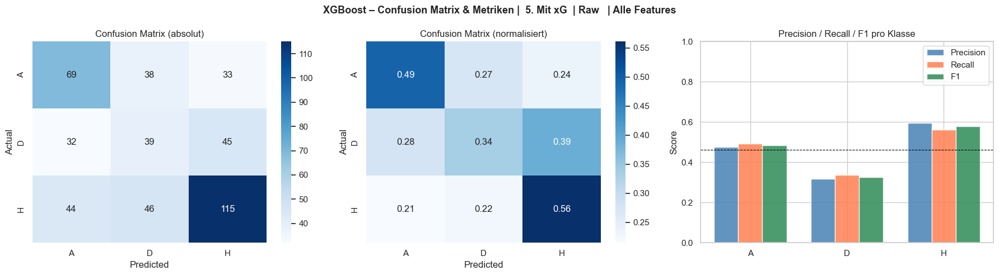

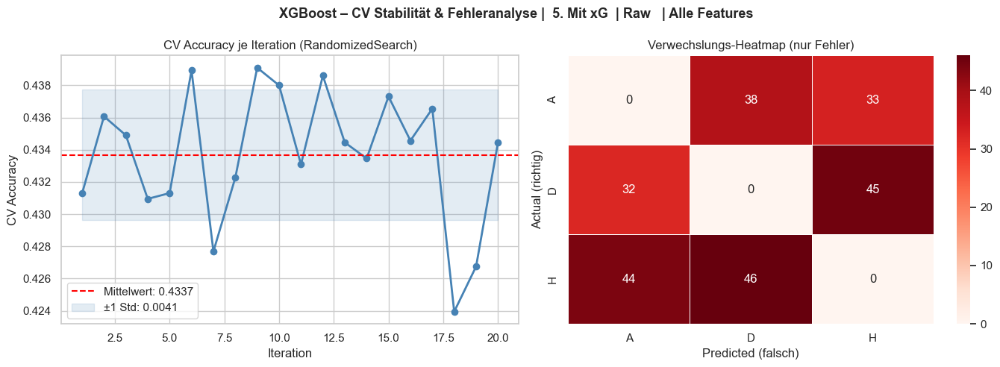

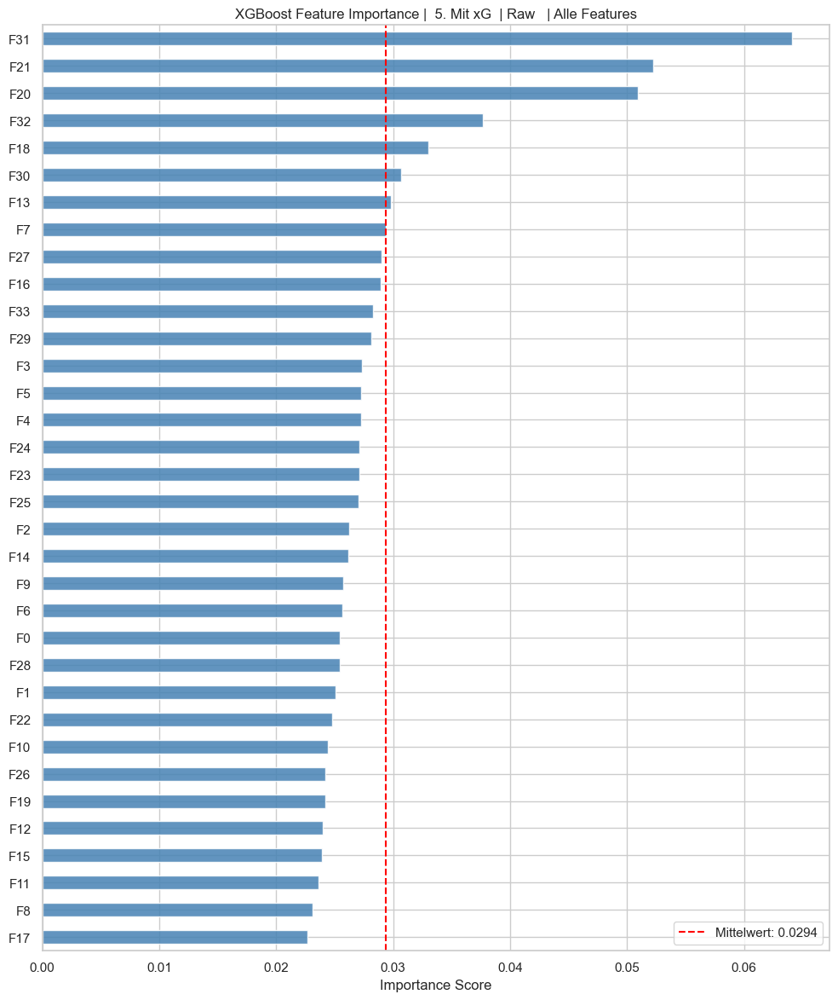

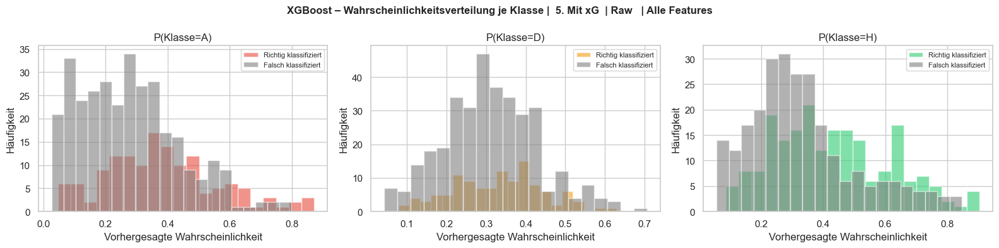


█████████████████████████████████████████████████████████████████
  MLP
█████████████████████████████████████████████████████████████████
═════════════════════════════════════════════════════════════════
  MLP – 11. Mit xG  | Raw   | PCA (Basis V6) 
═════════════════════════════════════════════════════════════════
  Accuracy  (gesamt):  0.4772
  F1        (macro):   0.4509
  Precision (macro):   0.4526
  Recall    (macro):   0.4500
─────────────────────────────────────────────────────────────────
  Klasse      Precision     Recall         F1
─────────────────────────────────────────────────────────────────
  A              0.5038     0.4714     0.4871
  D              0.3009     0.2931     0.2969
  H              0.5530     0.5854     0.5687
═════════════════════════════════════════════════════════════════

  Beste Hyperparameter:
  {'max_iter': 500, 'learning_rate_init': 0.005, 'hidden_layer_sizes': (256, 128, 64), 'alpha': 0.01, 'activation': 'tanh'}



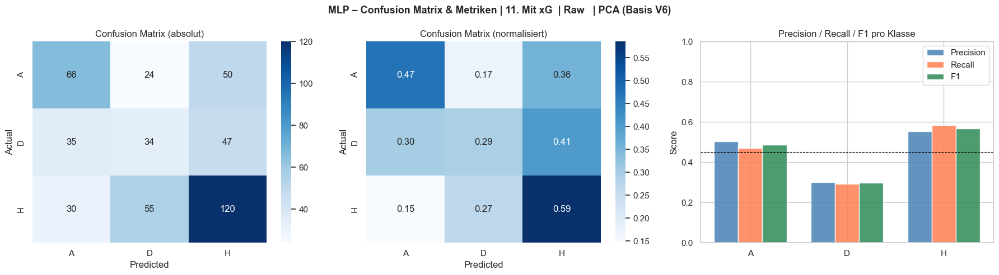

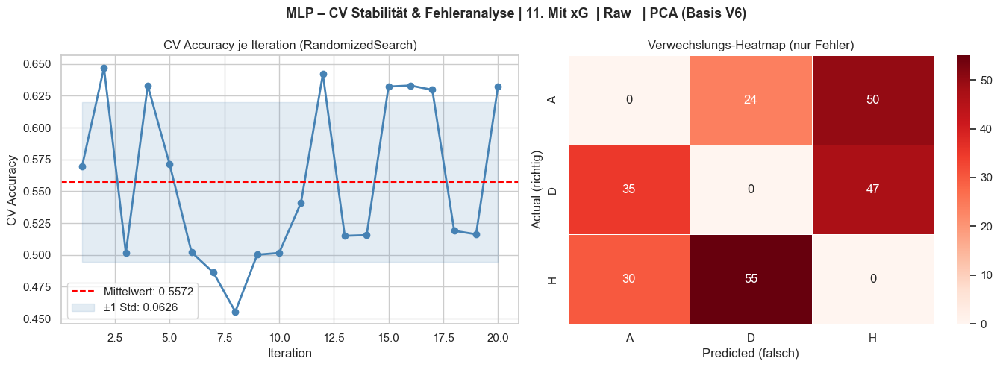

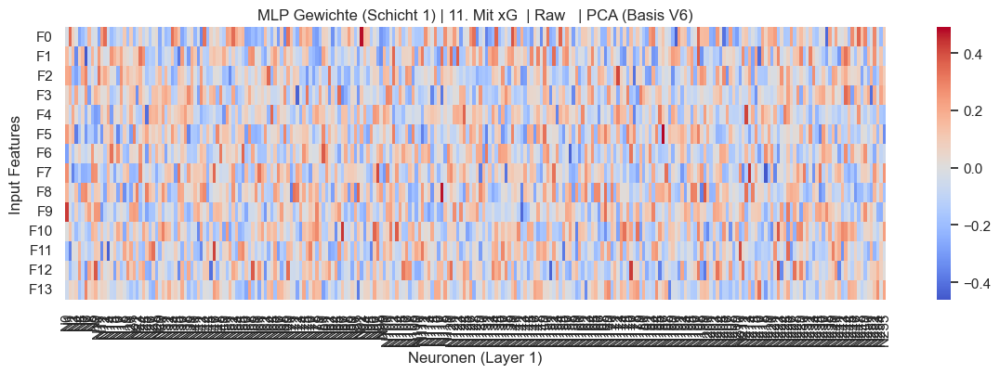

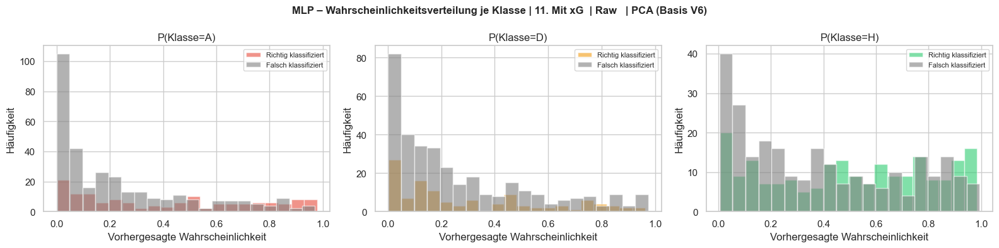


══════════════════════════════════════════════════════════════════════
  FINALER VERGLEICH ALLER MODELLE
══════════════════════════════════════════════════════════════════════


,Modell,F1 macro,F1 Draw,Accuracy,Precision,Recall
1,RF,0.4875,0.3489,0.5098,0.4872,0.4884
0,LogReg,0.4715,0.3122,0.4967,0.4718,0.4714
3,XGBoost,0.4628,0.3264,0.4837,0.4629,0.4633
4,MLP,0.4509,0.2969,0.4772,0.4526,0.4500
2,LGBM,0.4434,0.3207,0.4664,0.4439,0.4431


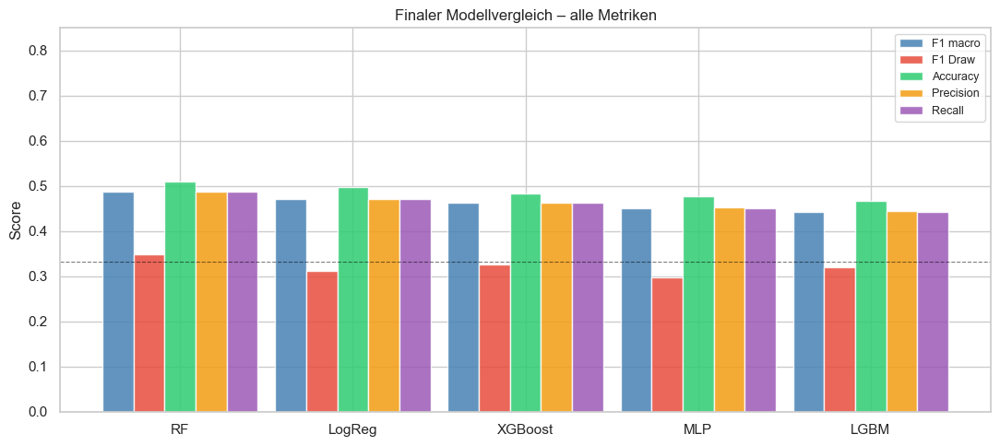


🏆 Gewinner: RF
   F1 macro: 0.4875
   F1 Draw:  0.3489


In [14]:
print("Starte finale Auswertung aller 5 Modelle...\n")

all_metrics = {}
for name in MODEL_NAMES:
    print("\n" + "█"*65)
    print(f"  {name}")
    print("█"*65)
    all_metrics[name] = full_evaluation(best_per_model[name], name, le, cv)

# ── Finaler Vergleich ─────────────────────────────────────────────────────────
print("\n" + "═"*70)
print("  FINALER VERGLEICH ALLER MODELLE")
print("═"*70)

compare_df = pd.DataFrame({
    'Modell':     MODEL_NAMES,
    'F1 macro':   [all_metrics[n]['f1']        for n in MODEL_NAMES],
    'F1 Draw':    [all_metrics[n]['f1_draw']    for n in MODEL_NAMES],
    'Accuracy':   [all_metrics[n]['acc']        for n in MODEL_NAMES],
    'Precision':  [all_metrics[n]['precision']  for n in MODEL_NAMES],
    'Recall':     [all_metrics[n]['recall']     for n in MODEL_NAMES],
}).sort_values('F1 macro', ascending=False).round(4)

display(compare_df)

# Balkendiagramm finaler Vergleich
fig, ax = plt.subplots(figsize=(11, 5))
x     = np.arange(len(compare_df))
width = 0.18
metric_cols   = ['F1 macro', 'F1 Draw', 'Accuracy', 'Precision', 'Recall']
metric_colors = ['steelblue', '#e74c3c', '#2ecc71', '#f39c12', '#9b59b6']

for i, (col, color) in enumerate(zip(metric_cols, metric_colors)):
    ax.bar(x + (i - 2) * width, compare_df[col], width,
           label=col, color=color, alpha=0.85)

ax.set_xticks(x)
ax.set_xticklabels(compare_df['Modell'])
ax.set_ylim(0, 0.85)
ax.set_ylabel('Score')
ax.set_title('Finaler Modellvergleich – alle Metriken')
ax.legend(fontsize=9)
ax.axhline(1/3, color='black', linestyle='--', linewidth=0.8,
           alpha=0.5, label='Random Baseline (33%)')
plt.tight_layout()
plt.show()

winner = compare_df.iloc[0]['Modell']
print(f"\n🏆 Gewinner: {winner}")
print(f"   F1 macro: {compare_df.iloc[0]['F1 macro']:.4f}")
print(f"   F1 Draw:  {compare_df.iloc[0]['F1 Draw']:.4f}")

### 5.3 Bestes Modell abspeichern

In [15]:
import joblib
from datetime import datetime

# ── Pfad definieren ────────────────────────────────────────────────────────────
SAVE_DIR = os.path.expanduser("~/Antigravity/Bachelor Arbeit/xx_Notebook")
os.makedirs(SAVE_DIR, exist_ok=True)

# ── Metadaten des besten Modells zusammenstellen ───────────────────────────────
best_model_name = compare_df.iloc[0]['Modell']
best_model_obj  = best_per_model[best_model_name]

save_package = {
    'model':        best_model_obj['model'],
    'scaler':       best_model_obj['scaler'],
    'model_type':   best_model_name,
    'variant':      best_model_obj['name'],
    'metrics': {
        'f1_macro':  compare_df.iloc[0]['F1 macro'],
        'f1_draw':   compare_df.iloc[0]['F1 Draw'],
        'accuracy':  compare_df.iloc[0]['Accuracy'],
        'precision': compare_df.iloc[0]['Precision'],
        'recall':    compare_df.iloc[0]['Recall'],
    },
    'best_params':  best_model_obj['best_params'],
    'saved_at':     datetime.now().strftime('%Y-%m-%d %H:%M'),
    'features':     variants[best_model_obj['name']][1],
    'le_classes':   list(le.classes_),
}

# ── Speichern ──────────────────────────────────────────────────────────────────
filename  = f"best_model_{best_model_name.lower()}.pkl"
save_path = os.path.join(SAVE_DIR, filename)
joblib.dump(save_package, save_path)

print("═"*60)
print(f"  ✅ Modell gespeichert!")
print("═"*60)
print(f"  Modell:    {best_model_name}")
print(f"  Variante:  {best_model_obj['name']}")
print(f"  F1 macro:  {compare_df.iloc[0]['F1 macro']:.4f}")
print(f"  F1 Draw:   {compare_df.iloc[0]['F1 Draw']:.4f}")
print(f"  Gespeichert am: {save_package['saved_at']}")
print(f"  Pfad: {save_path}")
print("═"*60)

# ── Ladebeispiel ausgeben ──────────────────────────────────────────────────────
print(f"""
Zum Laden in einem anderen Notebook:

    import joblib
    package = joblib.load(r'{save_path}')
    model   = package['model']
    scaler  = package['scaler']
    # Features skalieren und vorhersagen:
    X_scaled = scaler.transform(X_new)
    y_pred   = model.predict(X_scaled)
""")

════════════════════════════════════════════════════════════
  ✅ Modell gespeichert!
════════════════════════════════════════════════════════════
  Modell:    RF
  Variante:   6. Mit xG  | Raw   | Starke Features
  F1 macro:  0.4875
  F1 Draw:   0.3489
  Gespeichert am: 2026-04-24 14:31
  Pfad: /Users/tom/Antigravity/Bachelor Arbeit/xx_Notebook/best_model_rf.pkl
════════════════════════════════════════════════════════════

Zum Laden in einem anderen Notebook:

    import joblib
    package = joblib.load(r'/Users/tom/Antigravity/Bachelor Arbeit/xx_Notebook/best_model_rf.pkl')
    model   = package['model']
    scaler  = package['scaler']
    # Features skalieren und vorhersagen:
    X_scaled = scaler.transform(X_new)
    y_pred   = model.predict(X_scaled)

